In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import warnings
warnings.filterwarnings("ignore")

In [46]:
pd.set_option("display.max_column",None)

In [47]:
pd.set_option("display.max_rows",None)

In [48]:
train_data=pd.read_csv("C:/Users/SRISTI/Desktop/projects files/fliprobo projects/Project-Housing--2-/Project-Housing_splitted/train.csv")
train_data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.0,14054,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,100,17,0,0,0,0,NaN,NaN,NaN,0,11,2006,New,Partial,219210
6,561,20,RL,NaN,11341,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,1957.0,Unf,2,528,TA,TA,Y,0,0,0,0,95,0,NaN,NaN,NaN,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.0,13125,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,TA,Attchd,1957.0,RFn,2,484,TA,TA,Y,0,0,0,0,0,0,NaN,GdPrv,NaN,0,1,2006,WD,Normal,155000
8,503,20,RL,70.0,9170,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1965.0,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,0,NaN,GdPrv,Shed,400,4,2007,WD,Normal,140000
9,576,50,RL,80.0,8480,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,Gas

In [49]:
test_data=pd.read_csv("C:/Users/SRISTI/Desktop/projects files/fliprobo projects/Project-Housing--2-/Project-Housing_splitted/test.csv")
test_data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
5,650,180,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,4,6,1970,1970,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,Gd,TA,Av,BLQ,131,GLQ,499,0,630,GasA,Gd,Y,SBrkr,630,0,0,630,1,0,1,0,1,1,TA,3,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,12,2007,WD,Normal
6,1453,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SLvl,5,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,80.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547,Unf,0,0,547,GasA,Gd,Y,SBrkr,1072,0,0,1072,1,0,1,0,2,1,TA,5,Typ,0,NaN,Basment,2005.0,Fin,2,525,TA,TA,Y,0,28,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal
7,152,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2007,2008,Hip,CompShg,VinylSd,VinylSd,Stone,436.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1400,Unf,0,310,1710,GasA,Ex,Y,SBrkr,1710,0,0,1710,1,0,2,0,2,1,Gd,6,Typ,1,Gd,Attchd,2007.0,RFn,3,866,TA,TA,Y,0,102,0,0,0,0,NaN,NaN,NaN,0,1,2008,New,Partial
8,427,80,RL,NaN,12800,Pave,NaN,Reg,Low,AllPub,Inside,Mod,SawyerW,Norm,Norm,1Fam,SLvl,7,5,1989,1989,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,145.0,Gd,TA,PConc,Gd,TA,Gd,GLQ,1518,Unf,0,0,1518,GasA,Gd,Y,SBrkr,1644,0,0,1644,1,1,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1989.0,Fin,2,569,TA,TA,Y,80,0,0,0,396,0,NaN,NaN,NaN,0,8,2009,WD,Normal
9,776,120,RM,32.0,4500,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Mitchel,Norm,Norm,TwnhsE,1Story,6,5,1998,1998,Hip,CompShg,VinylSd,VinylSd,BrkFace,320.0,TA,TA,PConc,Ex,TA,No,GLQ,866,Unf,0,338,1204,GasA,Ex,Y,SBrkr,1204,0,0,1204,1,0,2,0,2,1,TA,5,Typ,0,NaN,Attchd,1998.0,Fin,2,412,TA,TA,

### EDA

In [50]:
dtn=train_data.copy()
dts=test_data.copy()

In [51]:
dtn.shape

(1168, 81)

In [52]:
dts.shape

(292, 80)

1. train dataset has 1168 rows and 81 columns.
2. test dataset has 292 rows and 80 columns.

In [53]:
dtn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

In [54]:
dts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int64  
 1   MSSubClass     292 non-null    int64  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    int64  
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    int64  
 18  OverallCon

1. train dataset has 3 float type column, 35 int type column and 43 object type column.
2. test dataset has 4 float type column, 34 int type column and 42 object type column.

In [55]:
dtn.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [56]:
dts.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
Alley            278
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

1. Both the dataset have many null values in many columns.

In [57]:
for i in dtn.columns:
    if dtn[i].dtypes=='object':
        print(dtn[i].unique())
        print(dtn[i].value_counts())

['RL' 'RM' 'FV' 'RH' 'C (all)']
RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64
['Pave' 'Grvl']
Pave    1164
Grvl       4
Name: Street, dtype: int64
[nan 'Grvl' 'Pave']
Grvl    41
Pave    36
Name: Alley, dtype: int64
['IR1' 'Reg' 'IR2' 'IR3']
Reg    740
IR1    390
IR2     32
IR3      6
Name: LotShape, dtype: int64
['Lvl' 'Bnk' 'HLS' 'Low']
Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64
['AllPub']
AllPub    1168
Name: Utilities, dtype: int64
['Inside' 'CulDSac' 'FR2' 'Corner' 'FR3']
Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64
['Gtl' 'Mod' 'Sev']
Gtl    1105
Mod      51
Sev      12
Name: LandSlope, dtype: int64
['NPkVill' 'NAmes' 'NoRidge' 'NWAmes' 'Gilbert' 'Sawyer' 'Edwards'
 'IDOTRR' 'CollgCr' 'Mitchel' 'Crawfor' 'BrDale' 'StoneBr' 'BrkSide'
 'NridgHt' 'OldTown' 'Somerst' 'Timber' 'SWISU' 'SawyerW' 'ClearCr'
 'Veenker' 'Blmngtn' 'MeadowV

In [58]:
for i in dts.columns:
    if dts[i].dtypes=='object':
        print(dts[i].unique())
        print(dts[i].value_counts())

['RL' 'RM' 'FV' 'C (all)']
RL         223
RM          55
FV          13
C (all)      1
Name: MSZoning, dtype: int64
['Pave' 'Grvl']
Pave    290
Grvl      2
Name: Street, dtype: int64
[nan 'Grvl' 'Pave']
Grvl    9
Pave    5
Name: Alley, dtype: int64
['IR1' 'Reg' 'IR3' 'IR2']
Reg    185
IR1     94
IR2      9
IR3      4
Name: LotShape, dtype: int64
['HLS' 'Lvl' 'Bnk' 'Low']
Lvl    265
Bnk     13
HLS      8
Low      6
Name: LandContour, dtype: int64
['AllPub' 'NoSeWa']
AllPub    291
NoSeWa      1
Name: Utilities, dtype: int64
['Corner' 'CulDSac' 'Inside' 'FR2' 'FR3']
Inside     210
Corner      41
CulDSac     25
FR2         14
FR3          2
Name: LotConfig, dtype: int64
['Gtl' 'Mod' 'Sev']
Gtl    277
Mod     14
Sev      1
Name: LandSlope, dtype: int64
['StoneBr' 'CollgCr' 'Crawfor' 'Somerst' 'MeadowV' 'Edwards' 'NridgHt'
 'SawyerW' 'Mitchel' 'BrkSide' 'NAmes' 'Timber' 'OldTown' 'Sawyer'
 'IDOTRR' 'SWISU' 'Gilbert' 'NWAmes' 'BrDale' 'NPkVill' 'NoRidge'
 'Blmngtn' 'Veenker' 'ClearCr']
NAmes 

1. street, alley and utilities has multiple category but its values are very much imbalanced so our model can be biased towards only one category of it so we have to drop it. 

In [59]:
dtn.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [60]:
dtn.drop(columns=['Id','Alley','Street','Utilities','PoolQC','Fence','MiscFeature'],axis=1,inplace=True)
dts.drop(columns=['Id','Alley','Street','Utilities','PoolQC','Fence','MiscFeature'],axis=1,inplace=True)

In [61]:
dtn.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,120,RL,NaN,4928,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,0,2,2007,WD,Normal,128000
1,20,RL,95.0,15865,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,0,10,2007,WD,Normal,268000
2,60,RL,92.0,9920,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,0,6,2007,WD,Normal,269790
3,20,RL,105.0,11751,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,0,1,2010,COD,Normal,190000
4,20,RL,NaN,16635,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,0,6,2009,WD,Normal,215000


1. we analyze the datasets and came to know that some columns have almost all values as zeros in it, so we should drop it. 

In [62]:
dtn.drop(columns=['3SsnPorch','PoolArea'],axis=1,inplace=True)
dts.drop(columns=['3SsnPorch','PoolArea'],axis=1,inplace=True)

In [63]:
dts.shape

(292, 71)

In [64]:
dtn.shape

(1168, 72)

### Visualizations

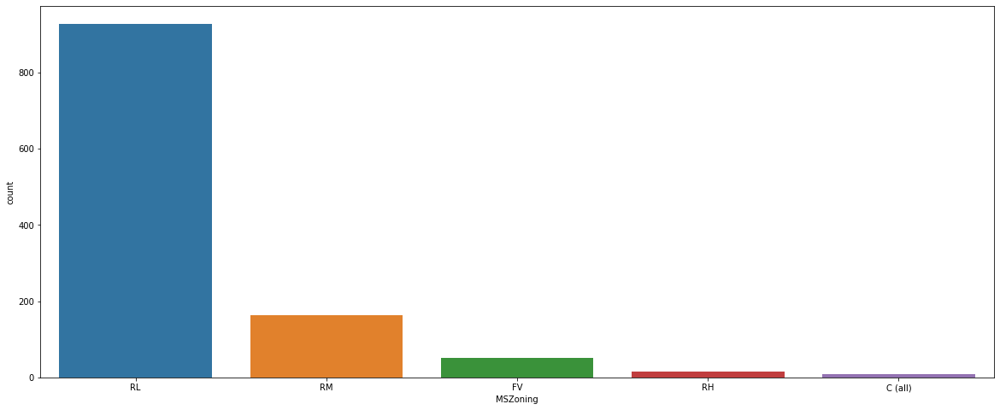

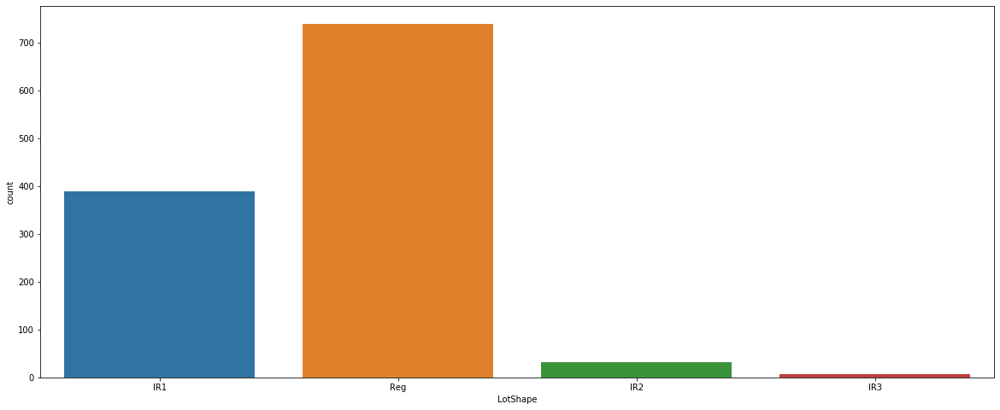

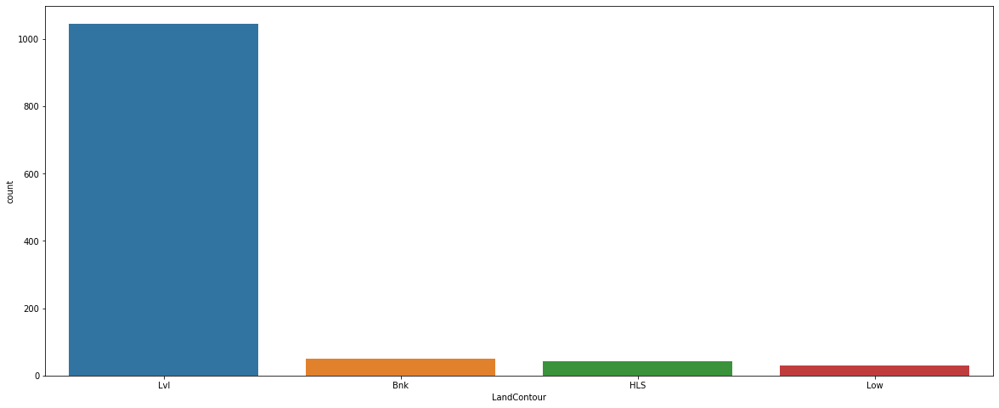

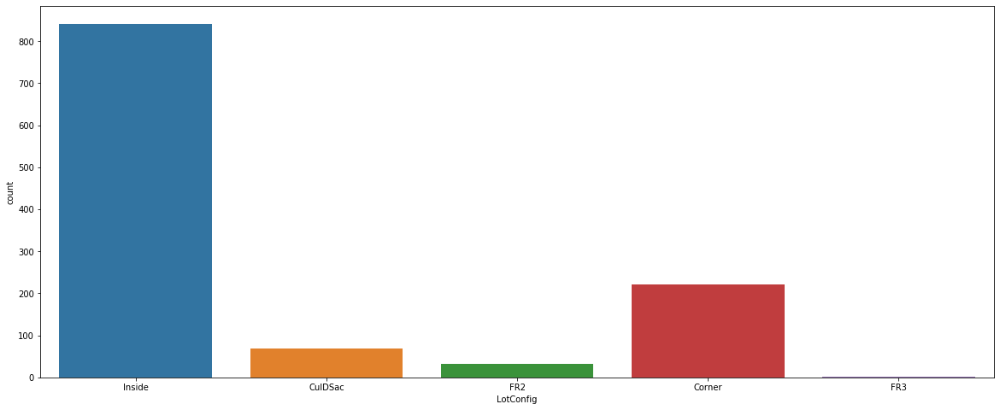

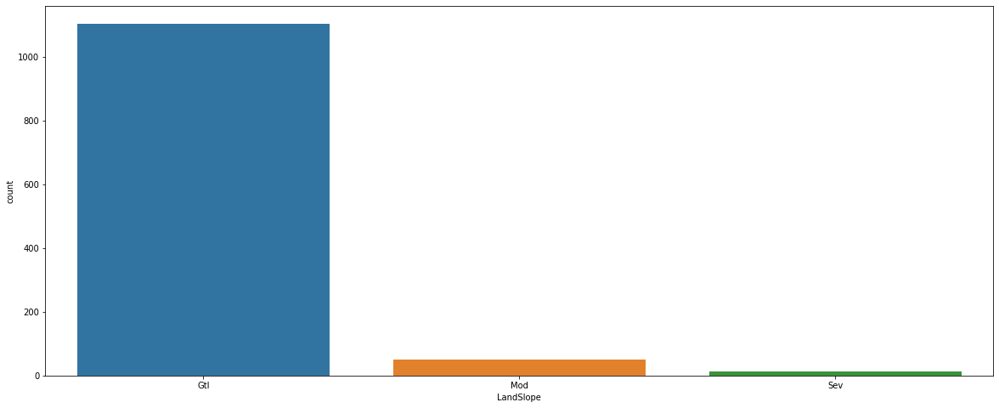

...

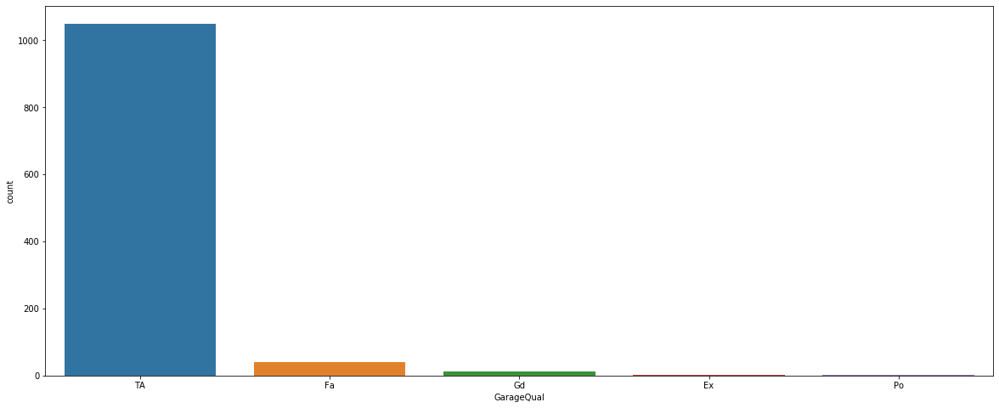

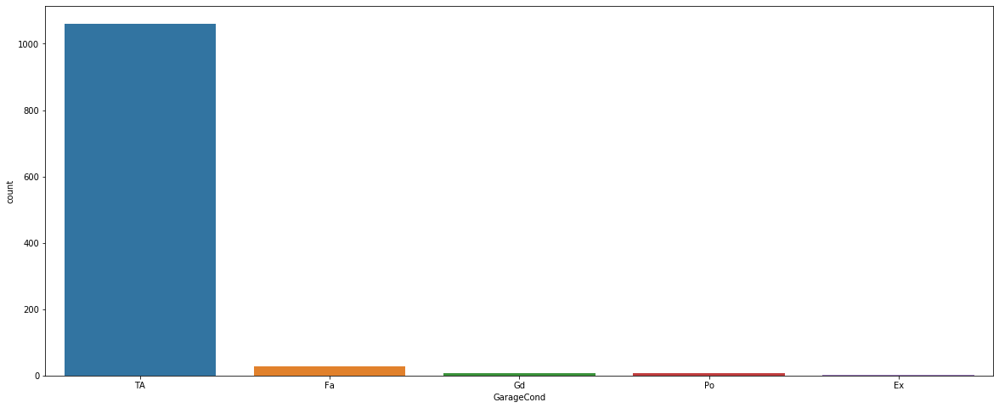

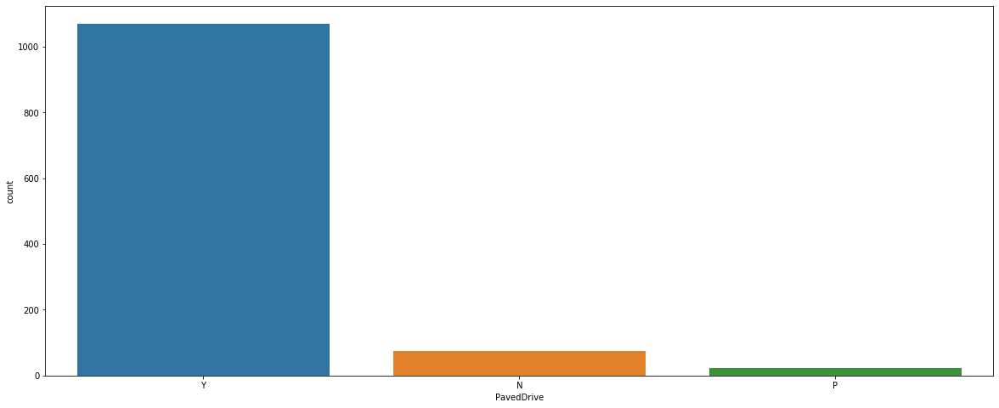

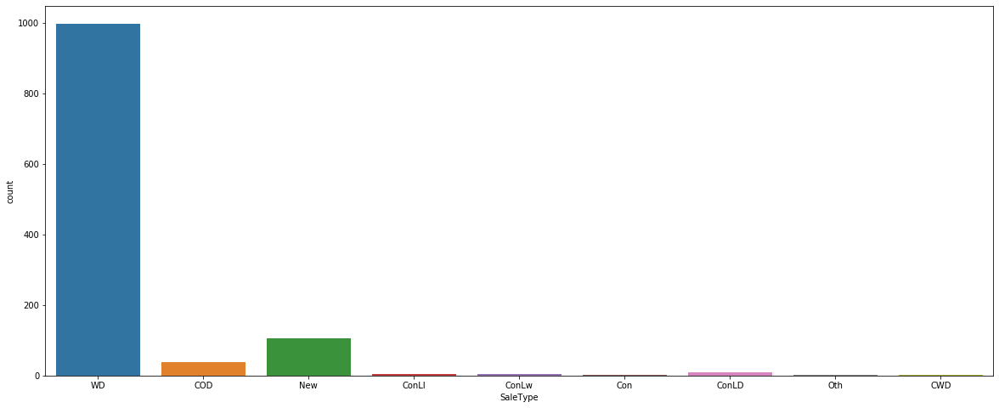

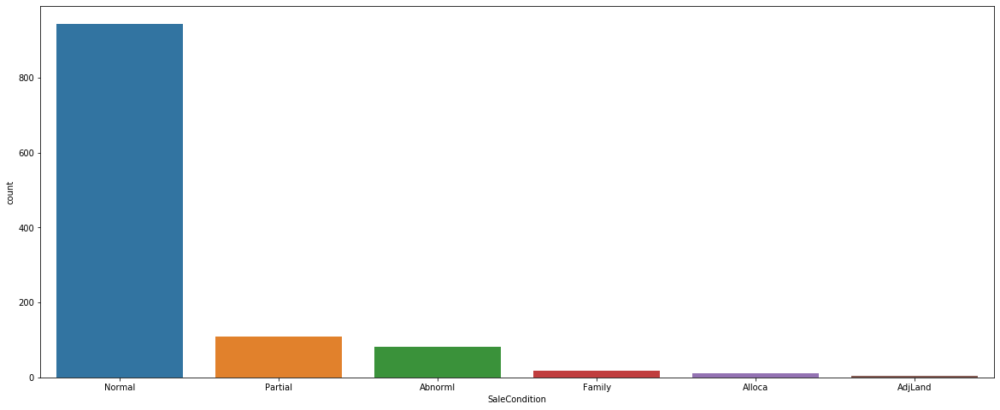

In [65]:
# train dataset
for i in dtn.columns:
    if dtn[i].dtypes=='object':
        plt.figure(figsize=(20,8))
        sns.countplot(dtn[i])
        plt.show()

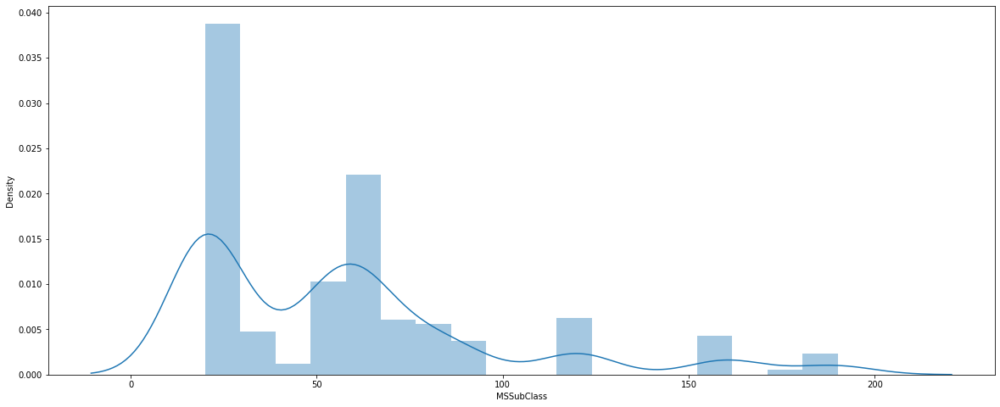

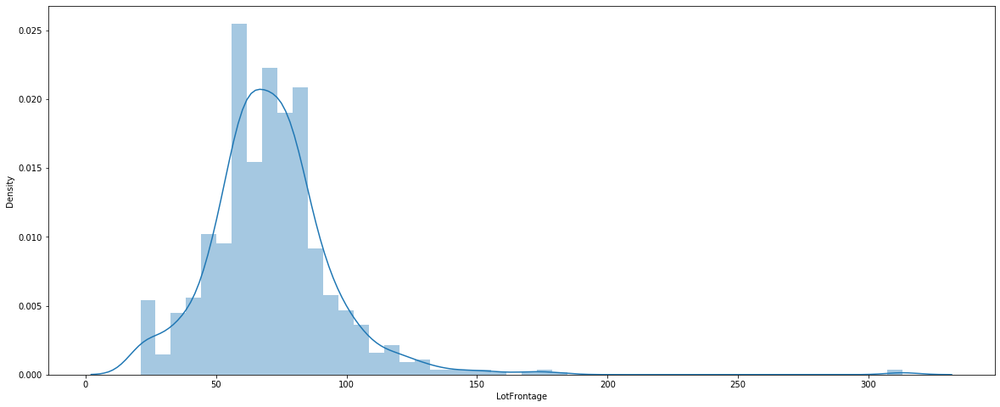

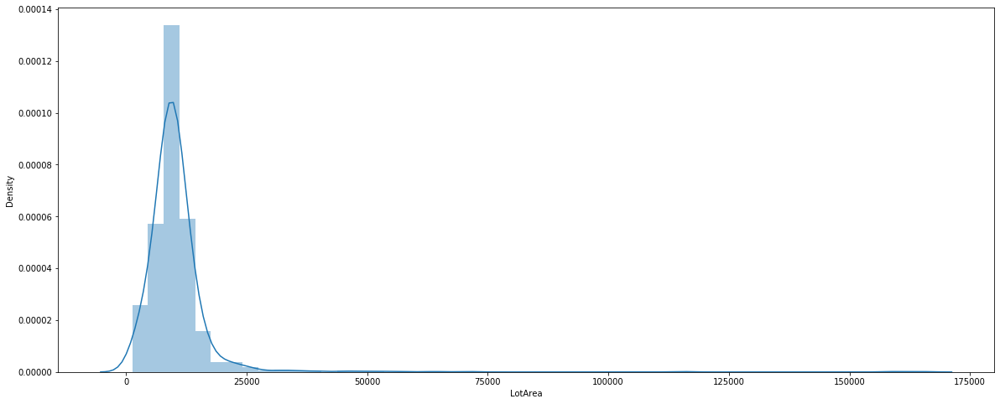

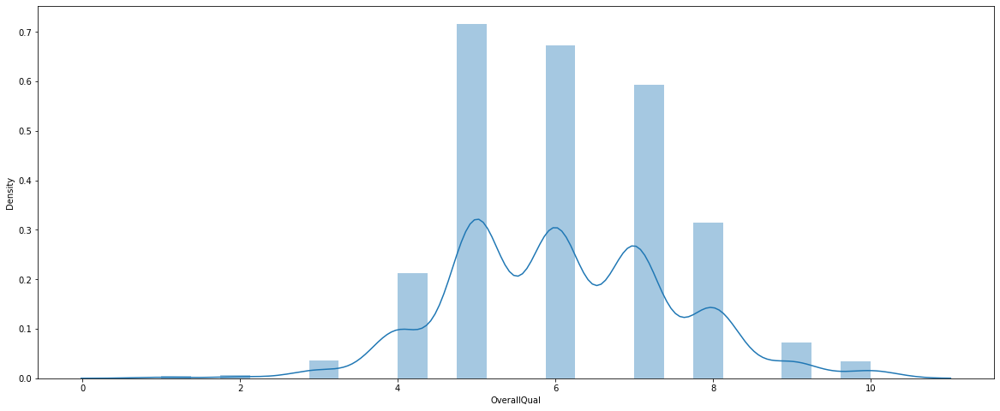

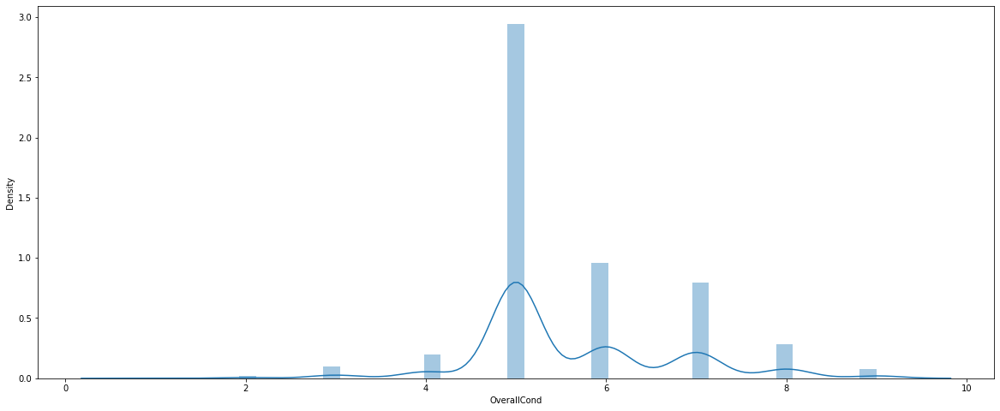

...

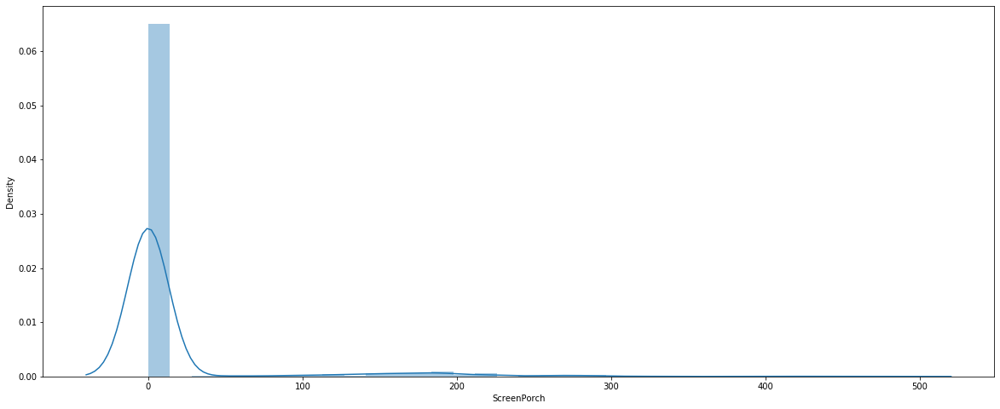

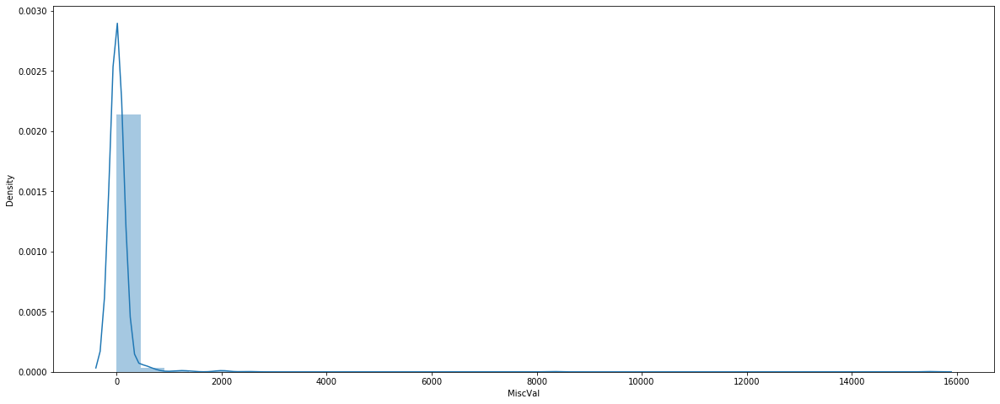

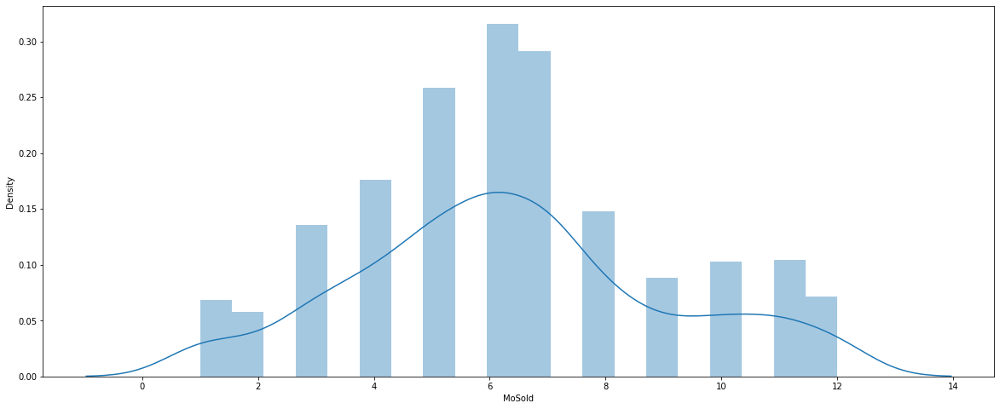

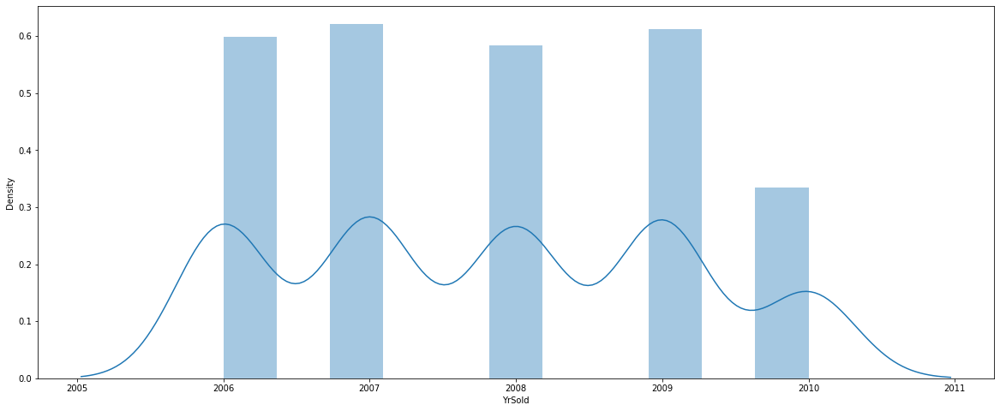

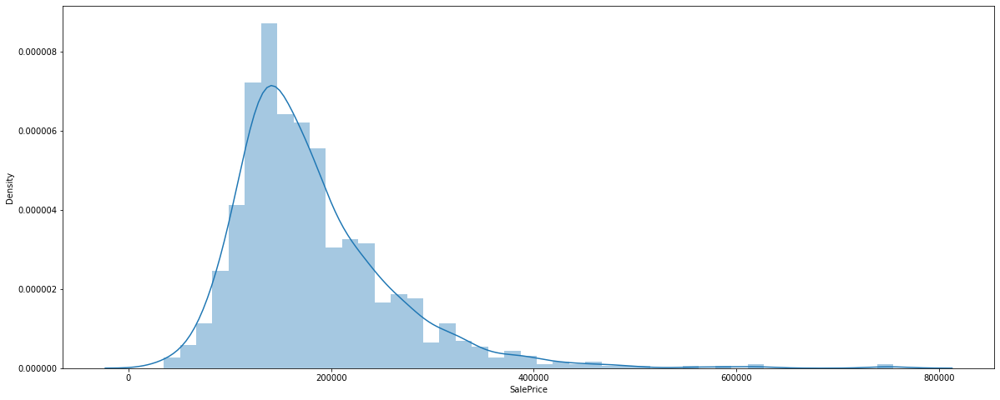

In [66]:
# train dataset
for i in dtn.columns:
    if dtn[i].dtypes!='object':
        plt.figure(figsize=(20,8))
        sns.distplot(dtn[i])
        plt.show()

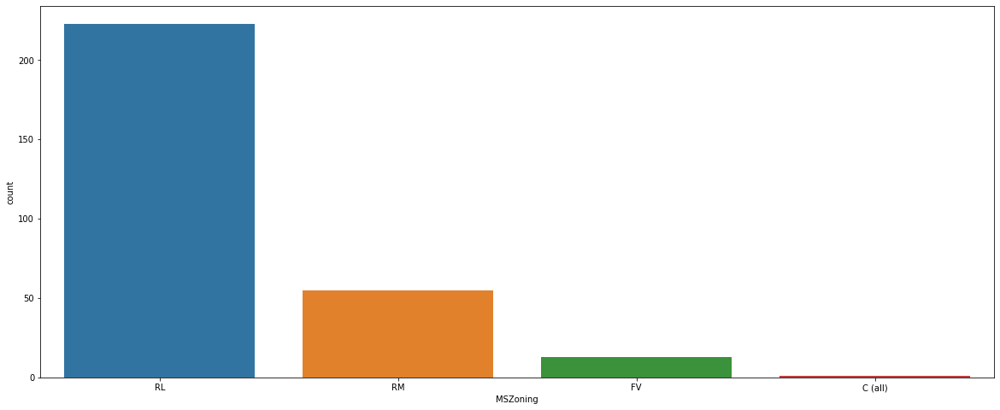

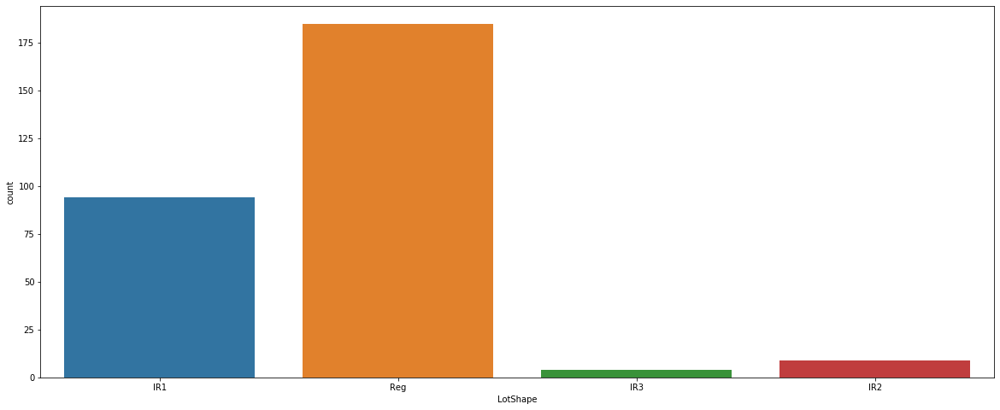

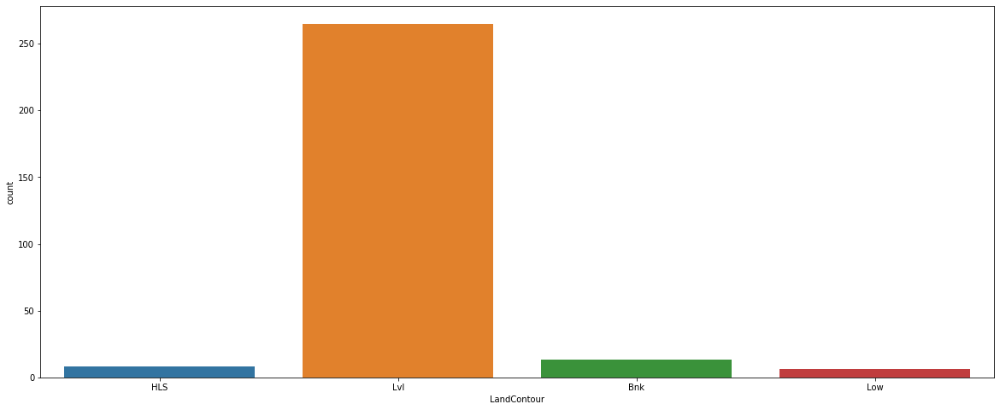

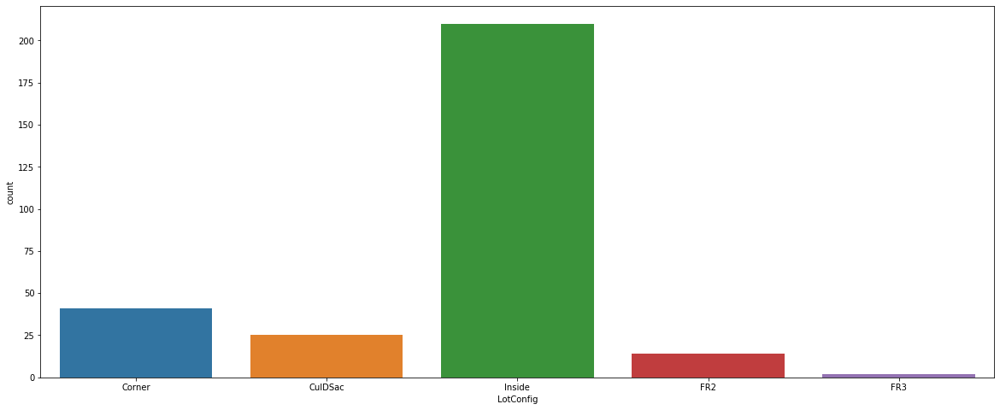

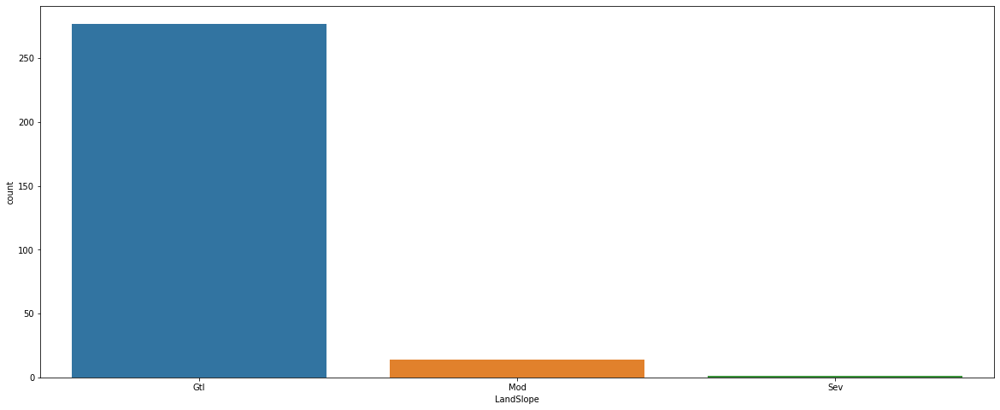

...

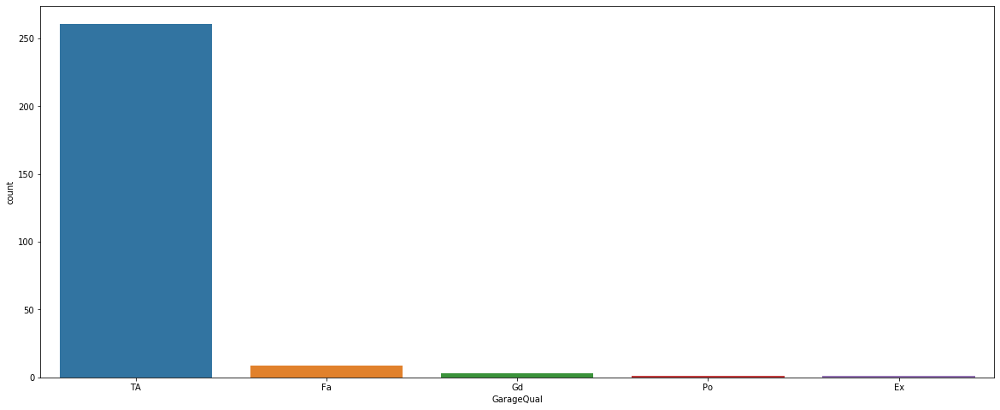

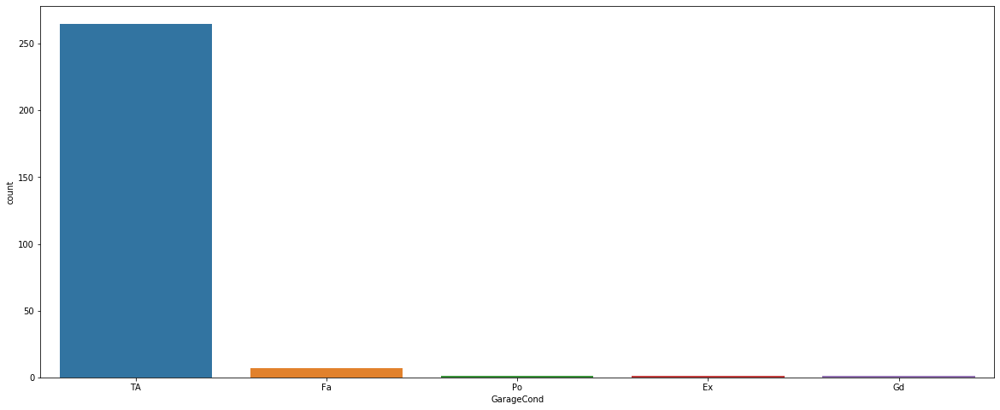

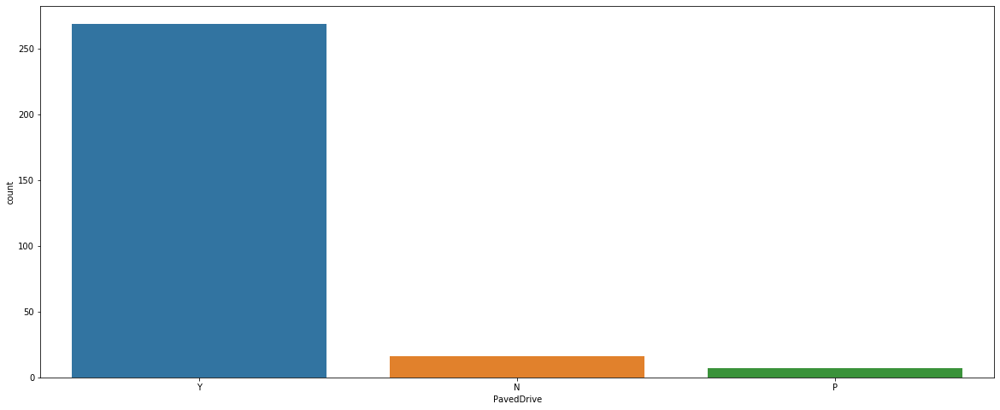

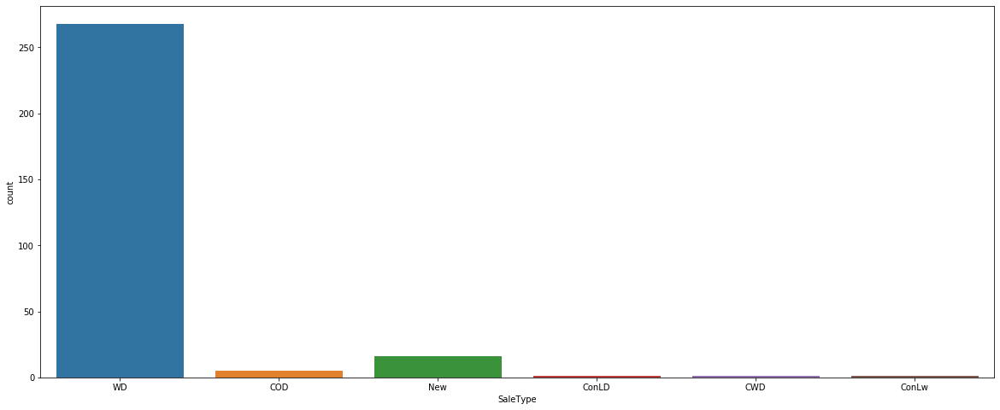

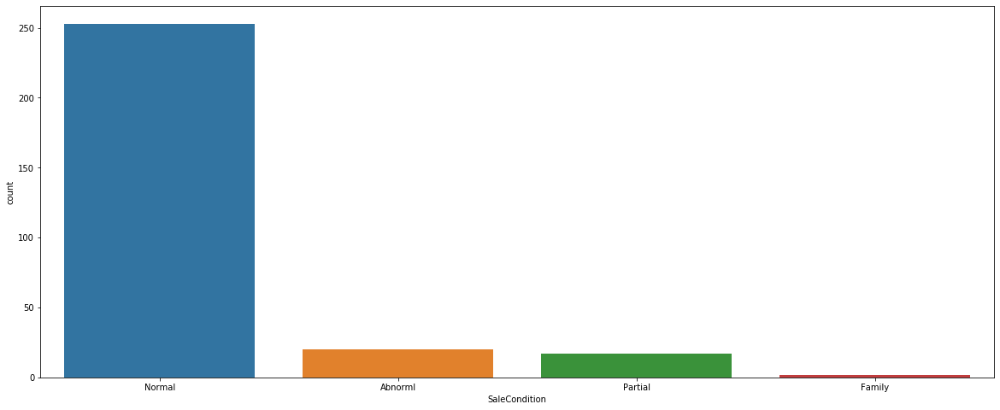

In [67]:
# test dataset
for i in dts.columns:
    if dts[i].dtypes=='object':
        plt.figure(figsize=(20,8))
        sns.countplot(dts[i])
        plt.show()

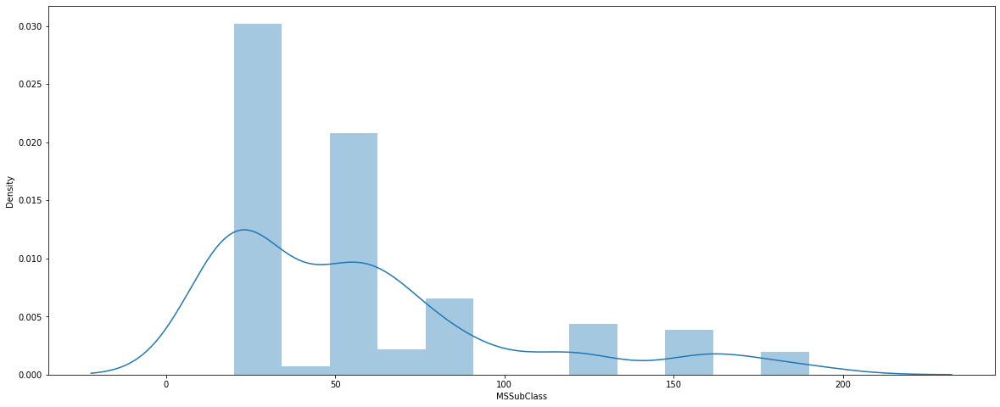

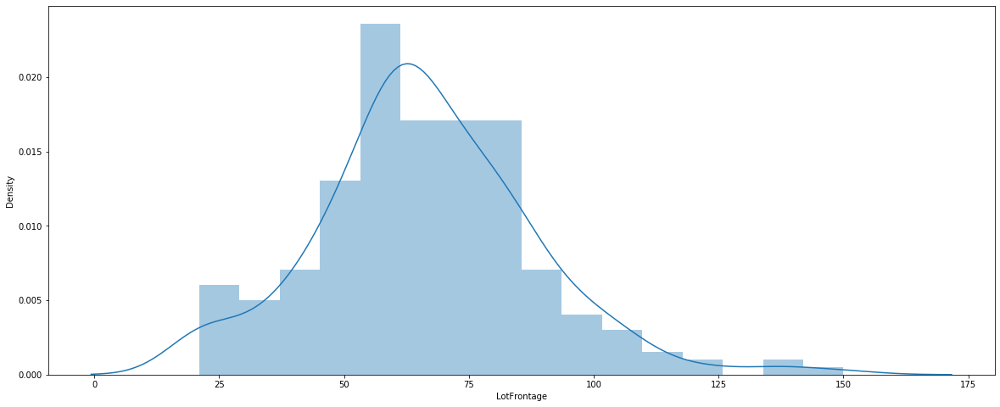

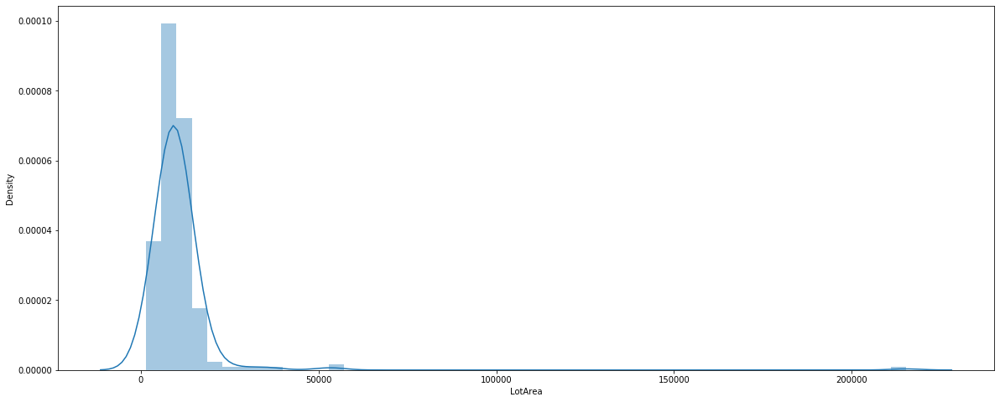

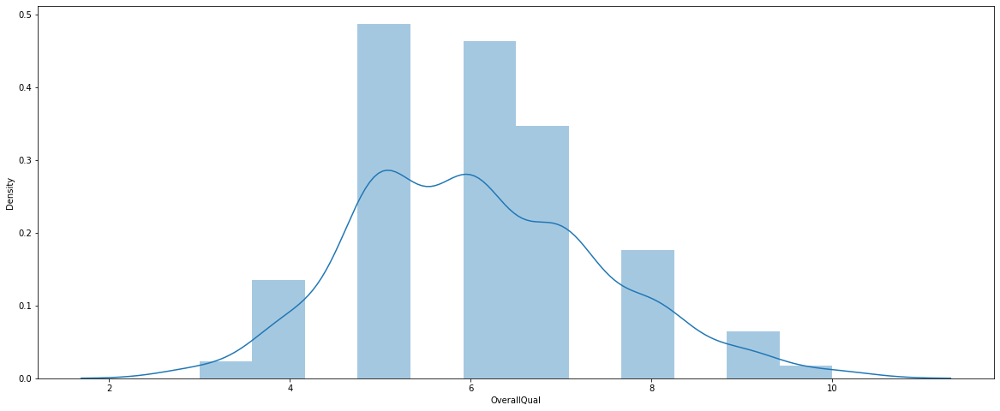

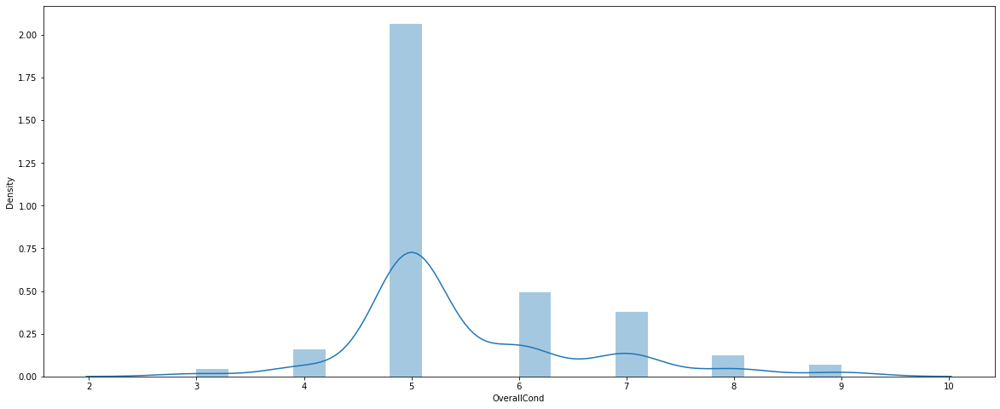

...

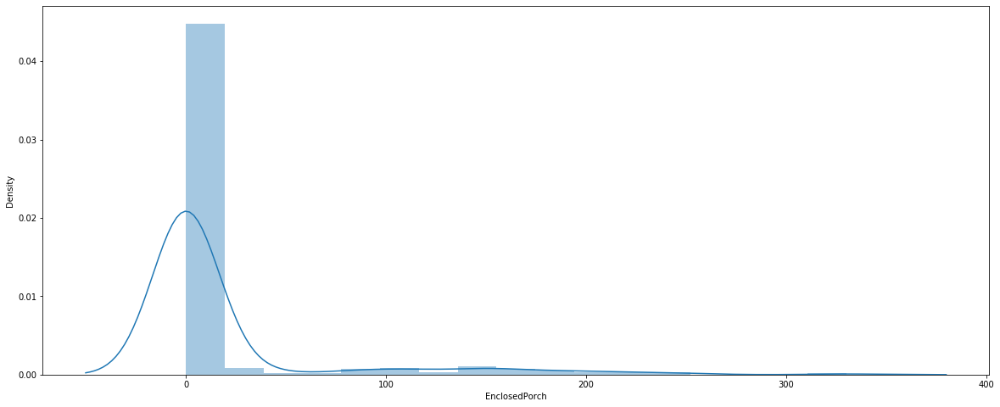

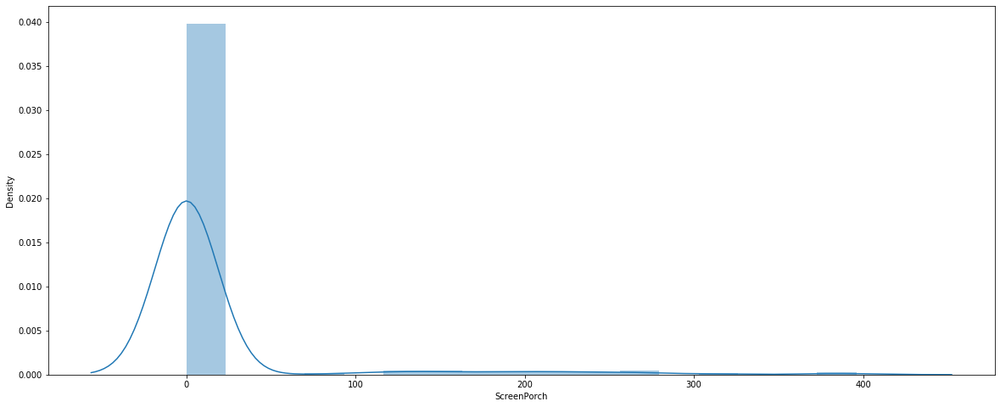

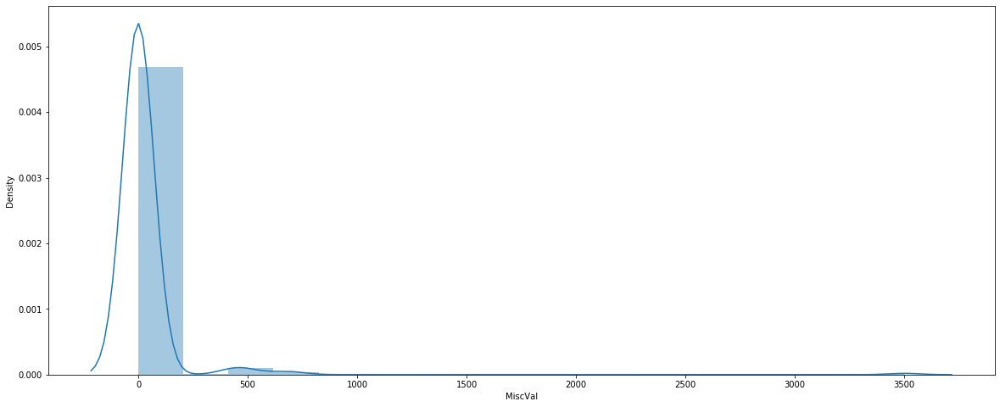

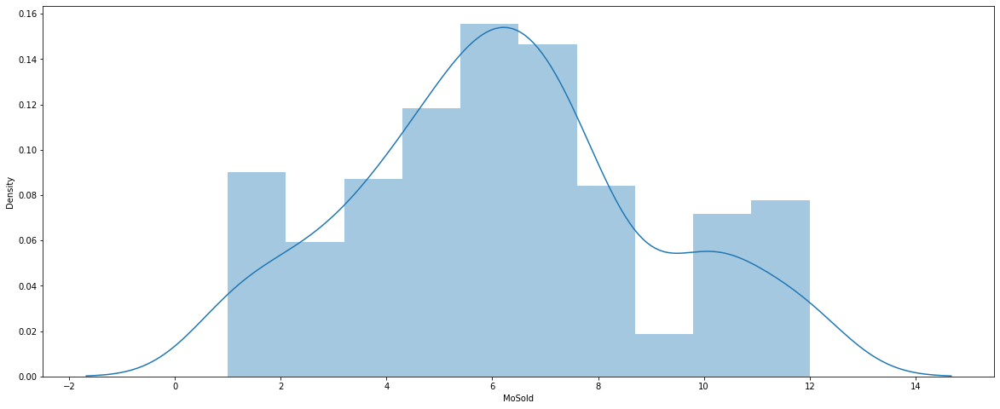

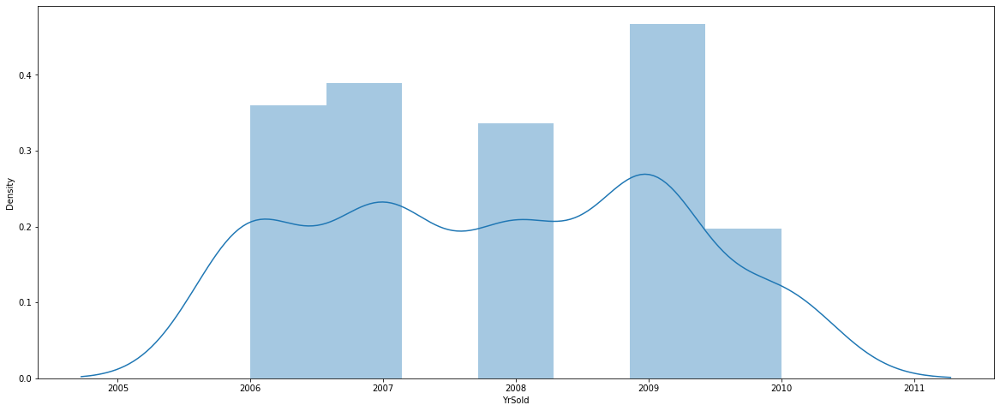

In [68]:
# test dataset
for i in dts.columns:
    if dts[i].dtypes!='object':
        plt.figure(figsize=(20,8))
        sns.distplot(dts[i])
        plt.show()

In [69]:
dtn.drop(columns=['ScreenPorch','MiscVal','EnclosedPorch'],axis=1,inplace=True)
dts.drop(columns=['ScreenPorch','MiscVal','EnclosedPorch'],axis=1,inplace=True)

In [70]:
dtn.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,120,RL,NaN,4928,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,2,2007,WD,Normal,128000
1,20,RL,95.0,15865,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,10,2007,WD,Normal,268000
2,60,RL,92.0,9920,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,6,2007,WD,Normal,269790
3,20,RL,105.0,11751,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,1,2010,COD,Normal,190000
4,20,RL,NaN,16635,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,6,2009,WD,Normal,215000


In [71]:
dts.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition
0,20,RL,86.0,14157,IR1,HLS,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,7,2007,WD,Normal
1,120,RL,NaN,5814,IR1,Lvl,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,8,2009,COD,Abnorml
2,20,RL,NaN,11838,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,6,2009,WD,Normal
3,70,RL,75.0,12000,Reg,Bnk,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,7,2009,WD,Normal
4,60,RL,86.0,14598,IR1,Lvl,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,1,2008,WD,Normal


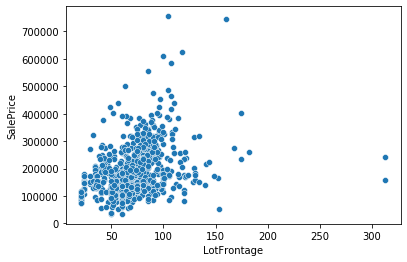

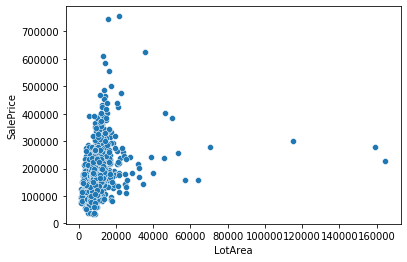

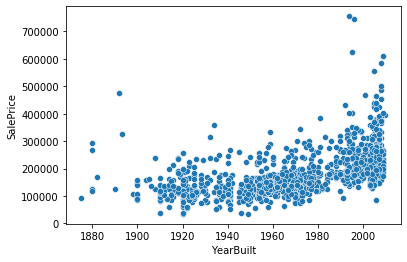

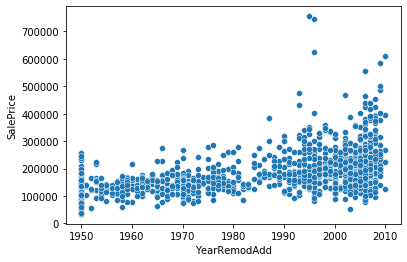

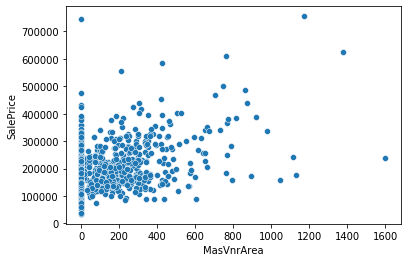

...

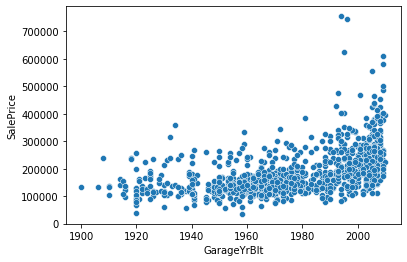

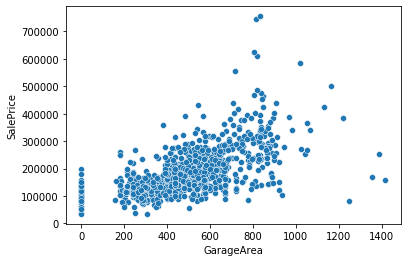

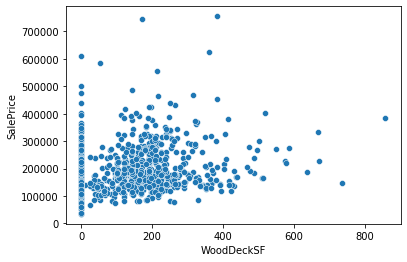

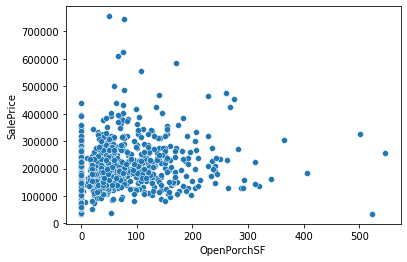

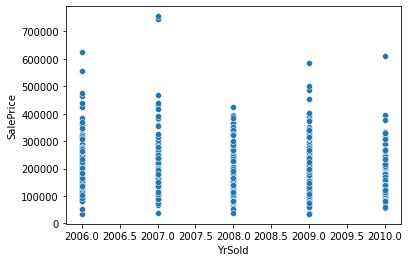

In [72]:
ls=['LotFrontage','LotArea','YearBuilt','YearRemodAdd','MasVnrArea','BsmtFinSF1','BsmtUnfSF','TotalBsmtSF','1stFlrSF',
    '2ndFlrSF','GrLivArea','GarageYrBlt','GarageArea','WoodDeckSF','OpenPorchSF','YrSold']

for i in ls:
    sns.scatterplot(x=dtn[i],y='SalePrice',data=dtn)
    plt.show()

Observations --
1. if LotArea increases from 0 to 20,000, SalePrice increases but after that it become less effective on SalePrice.
2. Much LotArea affect the SalePrice negatively.
3. BsmtUnfSF show somewhat constant behavior with saleprice till 1000 after that it has positive relation with saleprice.
4. GrLivArea is very much positively related to saleprice.
5. Later the house bulit, price tended to increase a lot.
6. GarageYrBlt is also affect the saleprice positively.
7. There is one more point that Garage are more important feature than basements.

In [73]:
# filling null values
# train data
dtn['LotFrontage']=dtn['LotFrontage'].fillna(dtn['LotFrontage'].median())
dtn['BsmtQual']=dtn['BsmtQual'].fillna(dtn['BsmtQual'].mode()[0])
dtn['BsmtCond']=dtn['BsmtCond'].fillna(dtn['BsmtCond'].mode()[0])
dtn['BsmtExposure']=dtn['BsmtExposure'].fillna(dtn['BsmtExposure'].mode()[0])
dtn['BsmtFinType1']=dtn['BsmtFinType1'].fillna(dtn['BsmtFinType1'].mode()[0])
dtn['BsmtFinType2']=dtn['BsmtFinType2'].fillna(dtn['BsmtFinType2'].mode()[0])
dtn['GarageType']=dtn['GarageType'].fillna(dtn['GarageType'].mode()[0])
dtn['GarageYrBlt']=dtn['GarageYrBlt'].fillna(dtn['GarageYrBlt'].mode()[0])
dtn['GarageFinish']=dtn['GarageFinish'].fillna(dtn['GarageFinish'].mode()[0])
dtn['GarageQual']=dtn['GarageQual'].fillna(dtn['GarageQual'].mode()[0])
dtn['GarageCond']=dtn['GarageCond'].fillna(dtn['GarageCond'].mode()[0])

In [74]:
# filling null values
# test data
dts['LotFrontage']=dts['LotFrontage'].fillna(dts['LotFrontage'].median())
dts['BsmtQual']=dts['BsmtQual'].fillna(dts['BsmtQual'].mode()[0])
dts['BsmtCond']=dts['BsmtCond'].fillna(dts['BsmtCond'].mode()[0])
dts['BsmtExposure']=dts['BsmtExposure'].fillna(dts['BsmtExposure'].mode()[0])
dts['BsmtFinType1']=dts['BsmtFinType1'].fillna(dts['BsmtFinType1'].mode()[0])
dts['BsmtFinType2']=dts['BsmtFinType2'].fillna(dts['BsmtFinType2'].mode()[0])
dts['GarageType']=dts['GarageType'].fillna(dts['GarageType'].mode()[0])
dts['GarageYrBlt']=dts['GarageYrBlt'].fillna(dts['GarageYrBlt'].mode()[0])
dts['GarageFinish']=dts['GarageFinish'].fillna(dts['GarageFinish'].mode()[0])
dts['GarageQual']=dts['GarageQual'].fillna(dts['GarageQual'].mode()[0])
dts['GarageCond']=dts['GarageCond'].fillna(dts['GarageCond'].mode()[0])

In [75]:
dtn.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage        0
LotArea            0
LotShape           0
LandContour        0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         7
MasVnrArea         7
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         0
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath           0
HalfBath           0
BedroomAbvGr 

In [76]:
dts.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage        0
LotArea            0
LotShape           0
LandContour        0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath           0
HalfBath           0
BedroomAbvGr 

1. Rest of the columns have very less number of null values hence we can drop it.

In [77]:
dtn.shape

(1168, 69)

In [78]:
dts.shape

(292, 68)

In [79]:
dtn['FireplaceQu']=dtn['FireplaceQu'].fillna(dtn['FireplaceQu'].mode()[0])
dts['FireplaceQu']=dts['FireplaceQu'].fillna(dts['FireplaceQu'].mode()[0])

In [81]:
dtn=dtn.dropna()
dts=dts.dropna()

In [82]:
dtn.shape

(1161, 69)

In [83]:
dts.shape

(290, 68)

1. all the null values are taken care.

In [84]:
dtn.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SalePrice
count,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000
mean,56.800172,70.788975,10472.236003,6.097330,5.600345,1970.766581,1984.660637,102.310078,442.980189,46.928510,569.331611,1059.240310,1168.240310,348.478036,6.418605,1523.136951,0.423773,0.055986,1.559862,0.386736,2.884582,1.044789,6.540913,0.615848,1979.590009,1.774332,476.322997,96.352283,46.217054,6.341085,2007.805340,181100.920758
std,41.984066,22.445975,8957.650913,1.387755,1.124400,30.133006,20.792287,182.595606,461.746169,163.972377,449.549147,441.407199,389.114796,439.452102,51.043749,528.132051,0.521523,0.237372,0.550931,0.504596,0.816075,0.215100,1.599113,0.649050,25.020248,0.746760,214.778498,126.206723,66.093594,2.680538,1.330675,78874.434375
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,60.000000,7596.000000,5.000000,5.000000,1953.000000,1966.000000,0.000000,0.000000,0.000000,216.000000,798.000000,892.000000,0.000000,0.000000,1140.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1962.000000,1.000000,336.000000,0.000000,0.000000,5.000000,2007.000000,130000.000000
50%,50.000000,70.000000,9525.000000,6.000000,5.000000,1972.000000,1993.000000,0.000000,384.000000,0.000000,474.000000,1004.000000,1096.000000,0.000000,0.000000,1466.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1984.000000,2.000000,480.000000,0.000000,24.000000,6.000000,2008.000000,163000.000000
75%,70.000000,79.000000,11500.000000,7.000000,6.000000,2000.000000,2004.000000,160.000000,712.000000,0.000000,816.000000,1288.000000,1392.000000,729.000000,0.000000,1790.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2003.000000,2.000000,576.000000,171.000000,69.000000,8.000000,2009.000000,215000.000000
max,190.000000,313.000000,164660.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,12.000000,2010.000000,755000.000000


In [85]:
dts.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold
count,290.000000,290.00000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000
mean,57.465517,66.17931,10650.220690,6.079310,5.496552,1972.396552,1985.158621,109.548276,439.451724,46.475862,558.651724,1044.579310,1134.772414,339.793103,3.727586,1478.293103,0.424138,0.065517,1.572414,0.358621,2.796552,1.051724,6.420690,0.600000,1981.006897,1.727586,457.320690,86.648276,47.244828,6.231034,2007.855172
std,43.856567,20.04758,13376.568174,1.358271,1.066146,30.435785,20.107385,175.214528,429.644457,152.945253,412.142658,424.185377,367.509118,424.908154,38.350301,515.693520,0.508853,0.247864,0.548604,0.494620,0.808682,0.236936,1.731727,0.621417,23.847844,0.756699,211.408795,122.211402,66.033745,2.781253,1.325707
min,20.000000,21.00000,1526.000000,3.000000,3.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,372.000000,0.000000,0.000000,520.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000,0.000000,1916.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000
25%,20.000000,57.25000,7200.000000,5.000000,5.000000,1954.000000,1968.000000,0.000000,0.000000,0.000000,253.000000,774.000000,858.500000,0.000000,0.000000,1060.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1965.000000,1.000000,300.000000,0.000000,0.000000,4.000000,2007.000000
50%,50.000000,65.00000,9193.500000,6.000000,5.000000,1976.000000,1994.000000,0.000000,369.500000,0.000000,490.000000,971.000000,1047.500000,0.000000,0.000000,1440.500000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1984.000000,2.000000,467.500000,0.000000,28.500000,6.000000,2008.000000
75%,70.000000,76.00000,11686.250000,7.000000,6.000000,2000.000000,2003.000000,180.000000,699.250000,0.000000,782.000000,1338.000000,1375.500000,719.000000,0.000000,1720.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2004.000000,2.000000,571.250000,149.750000,66.000000,8.000000,2009.000000
max,190.000000,150.00000,215245.000000,10.000000,9.000000,2009.000000,2010.000000,1031.000000,1767.000000,1085.000000,1935.000000,3094.000000,2402.000000,1589.000000,479.000000,3447.000000,2.000000,1.000000,3.000000,2.000000,6.000000,3.000000,12.000000,2.000000,2010.000000,4.000000,1052.000000,728.000000,418.000000,12.000000,2010.000000


1. some of the columns have huge difference between 75% value and max value that means outliers are present in that columns.
2. maximum columns have huge difference between mean and std that means columns are not normally distributed.

### Checking for outliers

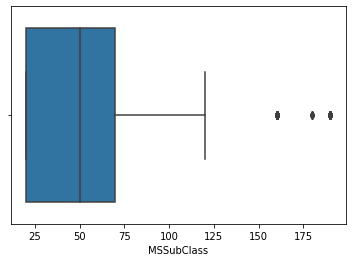

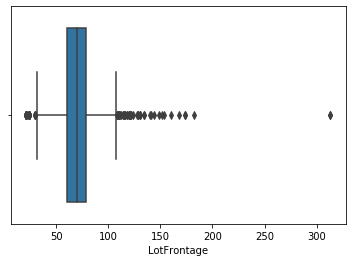

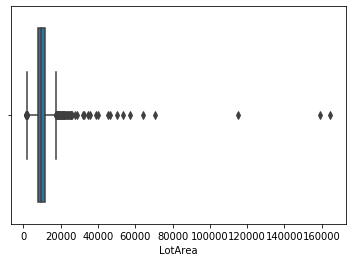

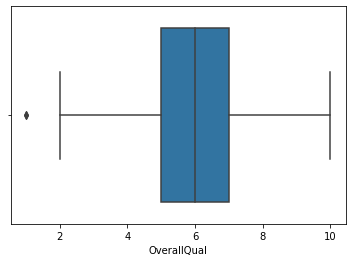

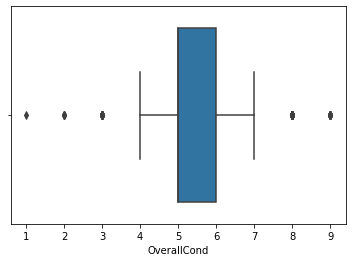

...

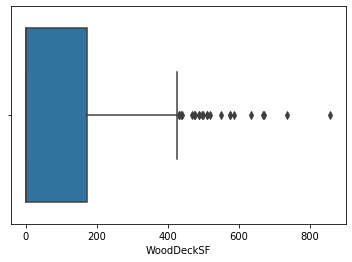

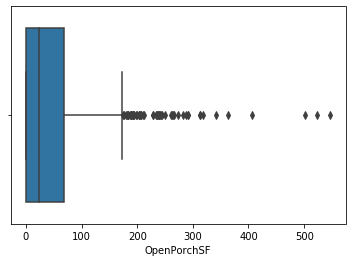

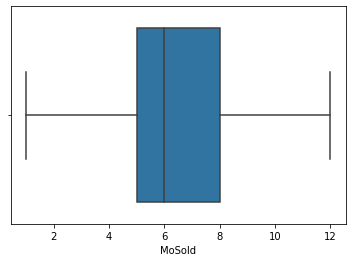

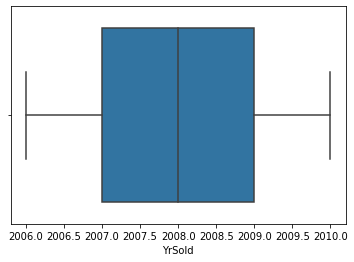

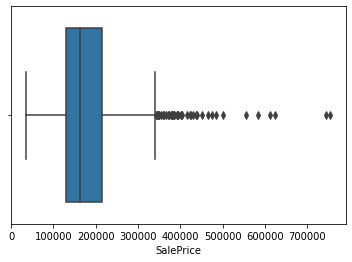

In [86]:
# train data
for i in dtn.columns:
    if dtn[i].dtypes!='object':
        sns.boxplot(dtn[i])
        plt.show()

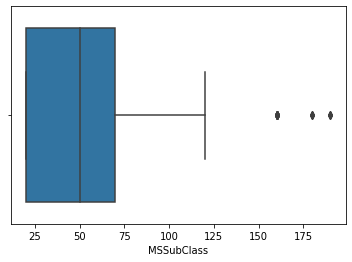

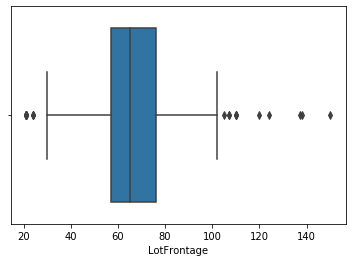

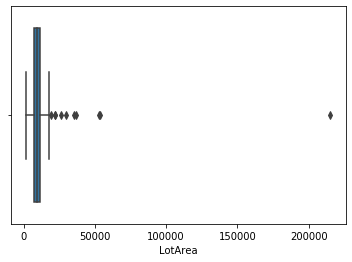

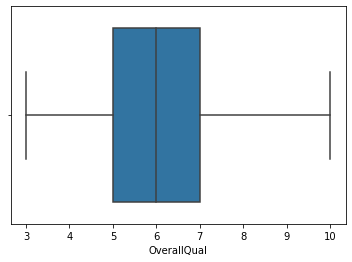

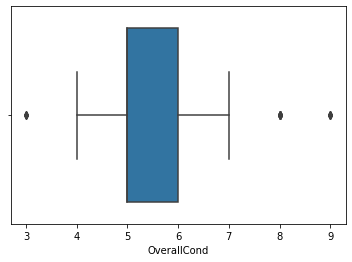

...

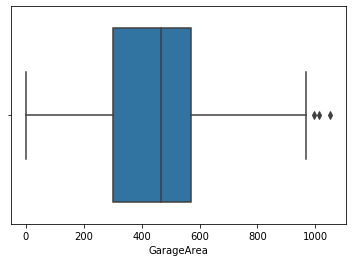

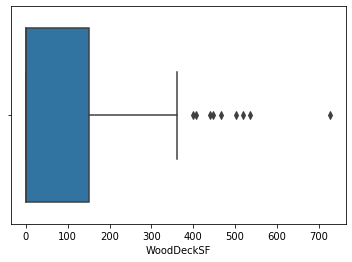

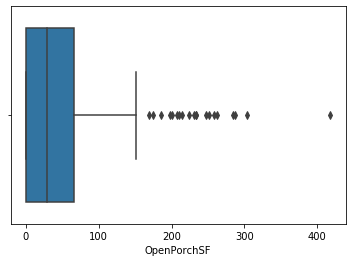

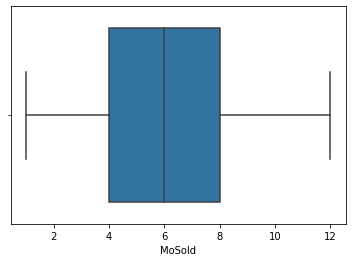

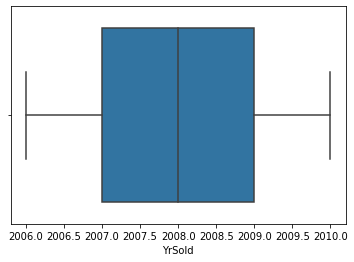

In [87]:
# test data
for i in dts.columns:
    if dts[i].dtypes!='object':
        sns.boxplot(dts[i])
        plt.show()

We will only remove the outliers from continuous type numerical columns. We don't remove the outlers from categorical columns.

In [88]:
dtn.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'LotShape',
       'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath',
       'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'MoSold',
   

In [89]:
# train data
# Removing the outliers using IQR method

cols=['MSSubClass','LotFrontage','MasVnrArea','BsmtFinSF1','BsmtUnfSF','TotalBsmtSF','1stFlrSF','GrLivArea',
     'GarageArea','WoodDeckSF','OpenPorchSF']
q1=dtn[cols].quantile(0.25)
q3=dtn[cols].quantile(0.75)
iqr=q3-q1
dtn=dtn[~((dtn[cols]<(q1-1.5*iqr))|(dtn[cols]>(q3+1.5*iqr))).any(axis=1)]

In [90]:
# test data
# Removing the outliers using IQR method

cols=['MSSubClass','LotFrontage','MasVnrArea','BsmtFinSF1','BsmtUnfSF','TotalBsmtSF','1stFlrSF','GrLivArea',
     'GarageArea','WoodDeckSF','OpenPorchSF']
q1=dts[cols].quantile(0.25)
q3=dts[cols].quantile(0.75)
iqr=q3-q1
dts=dts[~((dts[cols]<(q1-1.5*iqr))|(dts[cols]>(q3+1.5*iqr))).any(axis=1)]

1. we removed the outliers from all the numerical and continuous type columns.

In [91]:
dtn.shape

(856, 69)

In [92]:
dts.shape

(207, 68)

### Checking for skewness

In [93]:
dtn.skew()

MSSubClass      0.861535
LotFrontage    -0.002816
LotArea         9.733024
OverallQual     0.066245
OverallCond     0.435497
YearBuilt      -0.465894
YearRemodAdd   -0.449405
MasVnrArea      1.446507
BsmtFinSF1      0.579311
BsmtFinSF2      4.461901
BsmtUnfSF       0.707908
TotalBsmtSF     0.455394
1stFlrSF        0.586830
2ndFlrSF        0.868670
LowQualFinSF    9.779112
GrLivArea       0.572482
BsmtFullBath    0.647382
BsmtHalfBath    4.133951
FullBath        0.097992
HalfBath        0.881357
BedroomAbvGr   -0.149186
KitchenAbvGr    6.248911
TotRmsAbvGrd    0.513199
Fireplaces      0.722614
GarageYrBlt    -0.597373
GarageCars     -0.271855
GarageArea     -0.093110
WoodDeckSF      0.930933
OpenPorchSF     1.270962
MoSold          0.241879
YrSold          0.093137
SalePrice       0.985422
dtype: float64

In [94]:
dts.skew()

MSSubClass       0.854116
LotFrontage      0.227171
LotArea          1.881209
OverallQual      0.316148
OverallCond      1.125627
YearBuilt       -0.596062
YearRemodAdd    -0.454754
MasVnrArea       1.576315
BsmtFinSF1       0.670971
BsmtFinSF2       3.752156
BsmtUnfSF        0.470554
TotalBsmtSF      0.074757
1stFlrSF         0.935319
2ndFlrSF         0.807348
LowQualFinSF    14.387495
GrLivArea        0.474995
BsmtFullBath     0.523759
BsmtHalfBath     3.630538
FullBath        -0.141200
HalfBath         1.008426
BedroomAbvGr     0.057098
KitchenAbvGr     4.509962
TotRmsAbvGrd     0.567370
Fireplaces       0.689461
GarageYrBlt     -0.626703
GarageCars      -0.361953
GarageArea      -0.156143
WoodDeckSF       1.161354
OpenPorchSF      1.032541
MoSold           0.095906
YrSold           0.042655
dtype: float64

In [95]:
from sklearn.preprocessing import PowerTransformer

In [96]:
# Removing the skewness

ls=['MSSubClass','LotArea','MasVnrArea','BsmtUnfSF','1stFlrSF','2ndFlrSF','WoodDeckSF','OpenPorchSF']

pt=PowerTransformer(method='yeo-johnson',standardize=True)
for i in ls:
    dtn[i]=pt.fit_transform(dtn[i].values.reshape(-1,1))
    dts[i]=pt.fit_transform(dts[i].values.reshape(-1,1))

In [97]:
dtn.skew()

MSSubClass      0.044875
LotFrontage    -0.002816
LotArea        -0.066651
OverallQual     0.066245
OverallCond     0.435497
YearBuilt      -0.465894
YearRemodAdd   -0.449405
MasVnrArea      0.569469
BsmtFinSF1      0.579311
BsmtFinSF2      4.461901
BsmtUnfSF      -0.269058
TotalBsmtSF     0.455394
1stFlrSF        0.002653
2ndFlrSF        0.454455
LowQualFinSF    9.779112
GrLivArea       0.572482
BsmtFullBath    0.647382
BsmtHalfBath    4.133951
FullBath        0.097992
HalfBath        0.881357
BedroomAbvGr   -0.149186
KitchenAbvGr    6.248911
TotRmsAbvGrd    0.513199
Fireplaces      0.722614
GarageYrBlt    -0.597373
GarageCars     -0.271855
GarageArea     -0.093110
WoodDeckSF      0.063588
OpenPorchSF     0.098866
MoSold          0.241879
YrSold          0.093137
SalePrice       0.985422
dtype: float64

In [98]:
dts.skew()

MSSubClass       0.037970
LotFrontage      0.227171
LotArea          0.000335
OverallQual      0.316148
OverallCond      1.125627
YearBuilt       -0.596062
YearRemodAdd    -0.454754
MasVnrArea       0.658152
BsmtFinSF1       0.670971
BsmtFinSF2       3.752156
BsmtUnfSF       -0.348873
TotalBsmtSF      0.074757
1stFlrSF         0.018596
2ndFlrSF         0.431550
LowQualFinSF    14.387495
GrLivArea        0.474995
BsmtFullBath     0.523759
BsmtHalfBath     3.630538
FullBath        -0.141200
HalfBath         1.008426
BedroomAbvGr     0.057098
KitchenAbvGr     4.509962
TotRmsAbvGrd     0.567370
Fireplaces       0.689461
GarageYrBlt     -0.626703
GarageCars      -0.361953
GarageArea      -0.156143
WoodDeckSF       0.292227
OpenPorchSF      0.027717
MoSold           0.095906
YrSold           0.042655
dtype: float64

In [99]:
# SalePrice is somewhat right skewed so we are goint to remove it

dtn['SalePrice']=np.log(dtn['SalePrice'].values.reshape(-1,1))

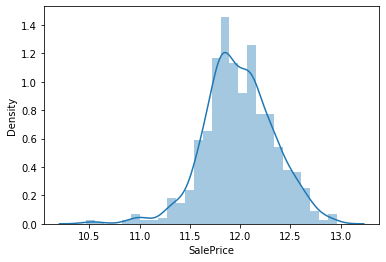

In [101]:
sns.distplot(dtn['SalePrice'])

1. we removed skewness from all the numerical and continuous type columns.

In [102]:
dtn.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice
2,0.683764,RL,92.0,0.246112,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,-0.760531,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,-0.595984,1117,GasA,Ex,Y,SBrkr,0.159669,1.279391,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,1.041869,1.323496,6,2007,WD,Normal,12.505399
4,-1.126647,RL,70.0,1.570212,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,1.301230,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,-0.292966,1602,GasA,Gd,Y,SBrkr,1.463217,-0.799450,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,1.142186,-0.981334,6,2009,WD,Normal,12.278393
5,0.683764,RL,58.0,1.148586,IR1,Lvl,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,-0.760531,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,0.840553,879,GasA,Ex,Y,SBrkr,-0.777752,1.293860,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,0.834031,0.486725,11,2006,New,Partial,12.297785
6,-1.126647,RL,70.0,0.598014,IR1,Lvl,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,1.356406,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,-1.268793,1392,GasA,TA,Y,SBrkr,0.945624,-0.799450,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,1957.0,Unf,2,528,TA,TA,Y,-0.984126,-0.981334,5,2010,WD,Normal,11.707670
7,-1.126647,RL,88.0,0.974781,Reg,Lvl,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,1.185981,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,-0.503742,1134,GasA,Ex,Y,SBrkr,1.895334,-0.799450,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,TA,Attchd,1957.0,RFn,2,484,TA,TA,Y,-0.984126,-0.981334,1,2006,WD,Normal,11.951180


In [103]:
dts.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition
0,-1.164476,RL,86.0,1.299928,IR1,HLS,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,1.416321,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,0.516578,1922,GasA,Ex,Y,SBrkr,2.110910,-0.809425,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,1.193934,0.935362,7,2007,WD,Normal
1,1.689698,RL,65.0,-1.239396,IR1,Lvl,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,-0.728486,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,-0.931649,1220,GasA,Gd,Y,SBrkr,1.044159,-0.809425,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,0.919140,-1.017429,8,2009,COD,Abnorml
3,0.888451,RL,75.0,0.827774,Reg,Bnk,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,-0.728486,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,-0.113100,704,GasA,Ex,Y,SBrkr,-0.736706,1.233984,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,-0.872893,-1.017429,7,2009,WD,Normal
4,0.649966,RL,86.0,1.387570,IR1,Lvl,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,1.271371,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,1.006980,894,GasA,Ex,Y,SBrkr,-0.567346,1.291158,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,1.047200,0.453512,1,2008,WD,Normal
8,1.091684,RL,65.0,1.012089,Reg,Low,Inside,Mod,SawyerW,Norm,Norm,1Fam,SLvl,7,5,1989,1989,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,1.375285,Gd,TA,PConc,Gd,TA,Gd,GLQ,1518,Unf,0,-2.168637,1518,GasA,Gd,Y,SBrkr,1.655082,-0.809425,0,1644,1,1,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1989.0,Fin,2,569,TA,TA,Y,0.986545,-1.017429,8,2009,WD,Normal


In [104]:
# converting years into number of years

dtn['YearBuilt']=2021-dtn['YearBuilt']
dtn['YearRemodAdd']=2021-dtn['YearRemodAdd']
dtn['GarageYrBlt']=2021-dtn['GarageYrBlt']
dtn['YrSold']=2021-dtn['YrSold']

In [105]:
# converting years into number of years

dts['YearBuilt']=2021-dts['YearBuilt']
dts['YearRemodAdd']=2021-dts['YearRemodAdd']
dts['GarageYrBlt']=2021-dts['GarageYrBlt']
dts['YrSold']=2021-dts['YrSold']

In [106]:
dtn.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice
2,0.683764,RL,92.0,0.246112,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,25,24,Gable,CompShg,MetalSd,MetalSd,None,-0.760531,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,-0.595984,1117,GasA,Ex,Y,SBrkr,0.159669,1.279391,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,24.0,Unf,2,455,TA,TA,Y,1.041869,1.323496,6,14,WD,Normal,12.505399
4,-1.126647,RL,70.0,1.570212,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,44,21,Gable,CompShg,CemntBd,CmentBd,Stone,1.301230,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,-0.292966,1602,GasA,Gd,Y,SBrkr,1.463217,-0.799450,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,44.0,Fin,2,529,TA,TA,Y,1.142186,-0.981334,6,12,WD,Normal,12.278393
5,0.683764,RL,58.0,1.148586,IR1,Lvl,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,15,15,Gable,CompShg,VinylSd,VinylSd,None,-0.760531,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,0.840553,879,GasA,Ex,Y,SBrkr,-0.777752,1.293860,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,15.0,Fin,3,660,TA,TA,Y,0.834031,0.486725,11,15,New,Partial,12.297785
6,-1.126647,RL,70.0,0.598014,IR1,Lvl,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,64,25,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,1.356406,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,-1.268793,1392,GasA,TA,Y,SBrkr,0.945624,-0.799450,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,64.0,Unf,2,528,TA,TA,Y,-0.984126,-0.981334,5,11,WD,Normal,11.707670
7,-1.126647,RL,88.0,0.974781,Reg,Lvl,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,64,21,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,1.185981,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,-0.503742,1134,GasA,Ex,Y,SBrkr,1.895334,-0.799450,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,TA,Attchd,64.0,RFn,2,484,TA,TA,Y,-0.984126,-0.981334,1,15,WD,Normal,11.951180


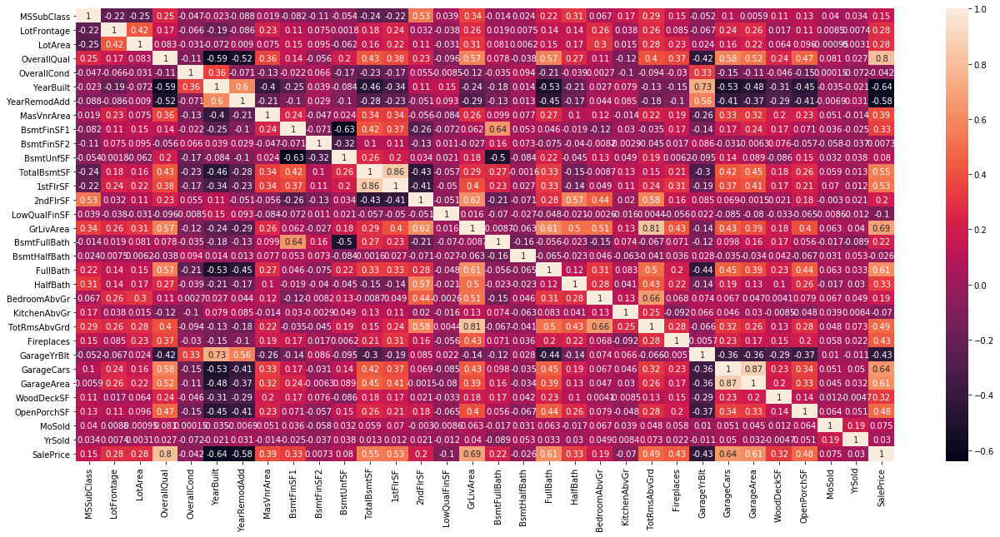

In [107]:
plt.figure(figsize=(22,10))
sns.heatmap(dtn.corr(),annot=True)

1. There are some columns which are highly collinear to each other that are given as - 
   TotalBsmt with 1stFlrSF, GarageCars with GarageArea, GarageYrBlt with YearBuilt, TotRmsAbvGrd with GrLivArea,
   TotRmsAbvGrd with BedroomAbvGr.

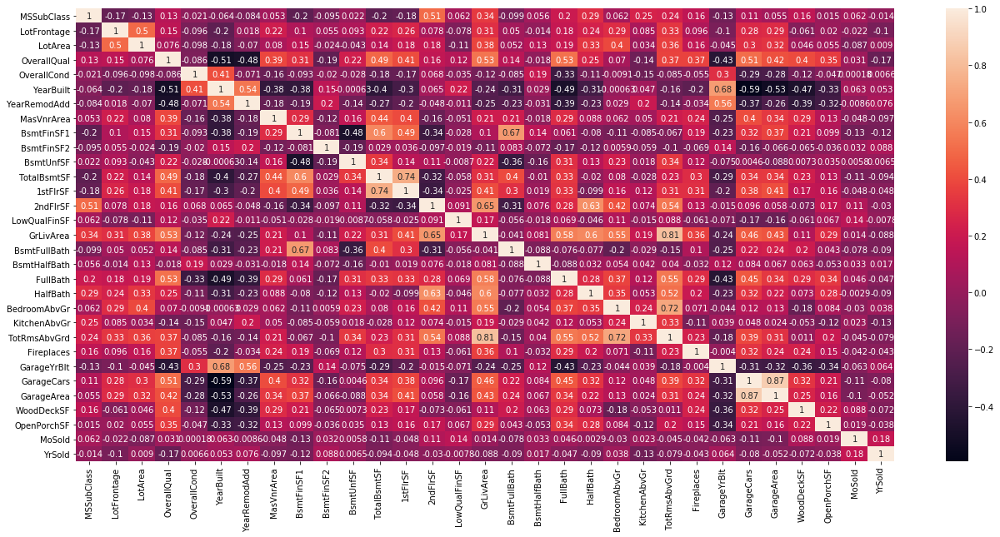

In [108]:
plt.figure(figsize=(22,10))
sns.heatmap(dts.corr(),annot=True)

In [109]:
dtn.shape

(856, 69)

In [110]:
dts.shape

(207, 68)

### Encoding the categorical columns

In [111]:
from sklearn.preprocessing import OrdinalEncoder
oe=OrdinalEncoder()

In [112]:
lst=['MSZoning','LotShape','LandContour','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType',
    'HouseStyle','RoofStyle','RoofMatl','Exterior1st','Exterior2nd','MasVnrType','ExterQual','ExterCond','Foundation',
    'BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','Heating','HeatingQC','CentralAir','Electrical',
    'KitchenQual','Functional','GarageType','GarageFinish','GarageQual','GarageCond','PavedDrive','SaleType','SaleCondition','FireplaceQu']

for i in lst:
    dtn[i]=oe.fit_transform(dtn[i].values.reshape(-1,1))
    dts[i]=oe.fit_transform(dts[i].values.reshape(-1,1))

In [113]:
dtn.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice
2,0.683764,3.0,92.0,0.246112,0.0,3.0,1.0,0.0,12.0,2.0,1.0,0.0,5.0,7,5,25,24,1.0,0.0,6.0,7.0,2.0,-0.760531,2.0,4.0,2.0,2.0,3.0,0.0,2.0,862,5.0,0,-0.595984,1117,0.0,0.0,1.0,3.0,0.159669,1.279391,0,2013,1,0,2,1,3,1,3.0,8,5.0,1,4.0,1.0,24.0,2.0,2,455,4.0,4.0,2.0,1.041869,1.323496,6,14,8.0,4.0,12.505399
4,-1.126647,3.0,70.0,1.570212,0.0,3.0,2.0,0.0,11.0,2.0,1.0,0.0,2.0,6,7,44,21,1.0,0.0,3.0,4.0,3.0,1.301230,2.0,4.0,1.0,2.0,3.0,3.0,0.0,1246,5.0,0,-0.292966,1602,0.0,2.0,1.0,3.0,1.463217,-0.799450,0,1602,0,1,2,0,3,1,2.0,8,5.0,1,4.0,1.0,44.0,0.0,2,529,4.0,4.0,2.0,1.142186,-0.981334,6,12,8.0,4.0,12.278393
5,0.683764,3.0,58.0,1.148586,0.0,3.0,4.0,0.0,6.0,2.0,1.0,0.0,5.0,7,5,15,15,1.0,0.0,10.0,12.0,2.0,-0.760531,2.0,4.0,2.0,2.0,3.0,0.0,5.0,0,5.0,0,0.840553,879,0.0,0.0,1.0,3.0,-0.777752,1.293860,0,1863,0,0,2,1,4,1,2.0,9,5.0,1,2.0,3.0,15.0,0.0,3,660,4.0,4.0,2.0,0.834031,0.486725,11,15,6.0,5.0,12.297785
6,-1.126647,3.0,70.0,0.598014,0.0,3.0,4.0,0.0,16.0,2.0,1.0,0.0,2.0,5,6,64,25,3.0,0.0,11.0,13.0,1.0,1.356406,3.0,4.0,1.0,2.0,3.0,3.0,0.0,1302,5.0,0,-1.268793,1392,0.0,4.0,1.0,3.0,0.945624,-0.799450,0,1392,1,0,1,1,3,1,3.0,5,4.0,1,2.0,5.0,64.0,2.0,2,528,4.0,4.0,2.0,-0.984126,-0.981334,5,11,8.0,4.0,11.707670
7,-1.126647,3.0,88.0,0.974781,3.0,3.0,0.0,0.0,16.0,2.0,1.0,0.0,2.0,5,4,64,21,1.0,0.0,11.0,13.0,0.0,1.185981,3.0,4.0,1.0,3.0,3.0,3.0,4.0,168,1.0,682,-0.503742,1134,0.0,0.0,1.0,3.0,1.895334,-0.799450,0,1803,1,0,2,0,3,1,3.0,8,0.0,1,4.0,1.0,64.0,1.0,2,484,4.0,4.0,2.0,-0.984126,-0.981334,1,15,8.0,4.0,11.951180


In [114]:
dts.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition
0,-1.164476,2.0,86.0,1.299928,0.0,1.0,0.0,0.0,19.0,2.0,0.0,0.0,2.0,9,5,16,15,3.0,0.0,9.0,11.0,3.0,1.416321,2.0,1.0,2.0,0.0,2.0,1.0,2.0,1249,4.0,0,0.516578,1922,0.0,0.0,1.0,3.0,2.110910,-0.809425,0,1922,1,0,2,0,3,1,2.0,8,3.0,1,2.0,0.0,16.0,0.0,3,676,4.0,4.0,2.0,1.193934,0.935362,7,14,5.0,2.0
1,1.689698,2.0,65.0,-1.239396,0.0,3.0,1.0,0.0,19.0,2.0,0.0,3.0,2.0,8,5,37,37,1.0,0.0,5.0,5.0,2.0,-0.728486,2.0,1.0,1.0,2.0,2.0,0.0,2.0,1036,4.0,0,-0.931649,1220,0.0,2.0,1.0,3.0,1.044159,-0.809425,0,1360,1,0,1,0,1,1,2.0,4,3.0,1,0.0,0.0,37.0,1.0,2,565,4.0,4.0,2.0,0.919140,-1.017429,8,12,0.0,0.0
3,0.888451,2.0,75.0,0.827774,3.0,0.0,4.0,0.0,4.0,2.0,0.0,0.0,4.0,7,7,80,71,1.0,0.0,6.0,7.0,2.0,-0.728486,3.0,1.0,1.0,3.0,2.0,3.0,4.0,275,4.0,0,-0.113100,704,0.0,0.0,1.0,3.0,-0.736706,1.233984,0,1564,0,0,1,1,3,1,1.0,7,3.0,1,2.0,0.0,80.0,2.0,1,234,4.0,4.0,2.0,-0.872893,-1.017429,7,12,5.0,2.0
4,0.649966,2.0,86.0,1.387570,0.0,3.0,1.0,0.0,18.0,1.0,0.0,0.0,4.0,6,5,14,14,1.0,0.0,9.0,11.0,3.0,1.271371,2.0,1.0,2.0,2.0,2.0,2.0,5.0,0,4.0,0,1.006980,894,0.0,0.0,1.0,3.0,-0.567346,1.291158,0,1933,0,0,2,1,4,1,2.0,9,3.0,1,2.0,1.0,14.0,0.0,3,668,4.0,4.0,2.0,1.047200,0.453512,1,13,5.0,2.0
8,1.091684,2.0,65.0,1.012089,3.0,2.0,4.0,1.0,17.0,2.0,0.0,0.0,6.0,7,5,32,32,1.0,0.0,10.0,12.0,1.0,1.375285,2.0,1.0,2.0,2.0,2.0,1.0,2.0,1518,4.0,0,-2.168637,1518,0.0,2.0,1.0,3.0,1.655082,-0.809425,0,1644,1,1,2,0,2,1,2.0,5,3.0,1,3.0,0.0,32.0,0.0,2,569,4.0,4.0,2.0,0.986545,-1.017429,8,12,5.0,2.0


### Spliting the data

In [115]:
X=dtn.drop('SalePrice',axis=1)

In [116]:
X.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition
2,0.683764,3.0,92.0,0.246112,0.0,3.0,1.0,0.0,12.0,2.0,1.0,0.0,5.0,7,5,25,24,1.0,0.0,6.0,7.0,2.0,-0.760531,2.0,4.0,2.0,2.0,3.0,0.0,2.0,862,5.0,0,-0.595984,1117,0.0,0.0,1.0,3.0,0.159669,1.279391,0,2013,1,0,2,1,3,1,3.0,8,5.0,1,4.0,1.0,24.0,2.0,2,455,4.0,4.0,2.0,1.041869,1.323496,6,14,8.0,4.0
4,-1.126647,3.0,70.0,1.570212,0.0,3.0,2.0,0.0,11.0,2.0,1.0,0.0,2.0,6,7,44,21,1.0,0.0,3.0,4.0,3.0,1.301230,2.0,4.0,1.0,2.0,3.0,3.0,0.0,1246,5.0,0,-0.292966,1602,0.0,2.0,1.0,3.0,1.463217,-0.799450,0,1602,0,1,2,0,3,1,2.0,8,5.0,1,4.0,1.0,44.0,0.0,2,529,4.0,4.0,2.0,1.142186,-0.981334,6,12,8.0,4.0
5,0.683764,3.0,58.0,1.148586,0.0,3.0,4.0,0.0,6.0,2.0,1.0,0.0,5.0,7,5,15,15,1.0,0.0,10.0,12.0,2.0,-0.760531,2.0,4.0,2.0,2.0,3.0,0.0,5.0,0,5.0,0,0.840553,879,0.0,0.0,1.0,3.0,-0.777752,1.293860,0,1863,0,0,2,1,4,1,2.0,9,5.0,1,2.0,3.0,15.0,0.0,3,660,4.0,4.0,2.0,0.834031,0.486725,11,15,6.0,5.0
6,-1.126647,3.0,70.0,0.598014,0.0,3.0,4.0,0.0,16.0,2.0,1.0,0.0,2.0,5,6,64,25,3.0,0.0,11.0,13.0,1.0,1.356406,3.0,4.0,1.0,2.0,3.0,3.0,0.0,1302,5.0,0,-1.268793,1392,0.0,4.0,1.0,3.0,0.945624,-0.799450,0,1392,1,0,1,1,3,1,3.0,5,4.0,1,2.0,5.0,64.0,2.0,2,528,4.0,4.0,2.0,-0.984126,-0.981334,5,11,8.0,4.0
7,-1.126647,3.0,88.0,0.974781,3.0,3.0,0.0,0.0,16.0,2.0,1.0,0.0,2.0,5,4,64,21,1.0,0.0,11.0,13.0,0.0,1.185981,3.0,4.0,1.0,3.0,3.0,3.0,4.0,168,1.0,682,-0.503742,1134,0.0,0.0,1.0,3.0,1.895334,-0.799450,0,1803,1,0,2,0,3,1,3.0,8,0.0,1,4.0,1.0,64.0,1.0,2,484,4.0,4.0,2.0,-0.984126,-0.981334,1,15,8.0,4.0


In [117]:
y=dtn['SalePrice'].copy()

### Scaling

In [118]:
from sklearn.preprocessing import MinMaxScaler
mm=MinMaxScaler()

In [119]:
x=mm.fit_transform(X)
x=pd.DataFrame(x,columns=X.columns)
x.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition
0,0.63954,0.75,0.800000,0.421191,0.0,1.0,0.25,0.0,0.571429,0.25,0.25,0.0,0.714286,0.666667,0.500,0.103704,0.216667,0.2,0.0,0.500000,0.500000,0.666667,0.000000,0.666667,1.0,0.666667,0.666667,1.0,0.0,0.4,0.532427,1.0,0.000000,0.366435,0.532351,0.0,0.0,1.0,1.0,0.610808,0.963648,0.0,0.687173,0.333333,0.0,0.666667,0.5,0.500000,0.333333,1.000000,0.555556,1.0,0.333333,1.0,0.2,0.125000,1.0,0.50,0.486111,1.0,1.0,1.0,0.871967,0.955445,0.454545,0.75,1.00,0.8
1,0.00000,0.75,0.506667,0.559845,0.0,1.0,0.50,0.0,0.523810,0.25,0.25,0.0,0.285714,0.555556,0.750,0.244444,0.166667,0.2,0.0,0.250000,0.285714,1.000000,0.929666,0.666667,1.0,0.333333,0.666667,1.0,1.0,0.0,0.769611,1.0,0.000000,0.438187,0.787480,0.0,0.5,1.0,1.0,0.829690,0.000000,0.0,0.507853,0.000000,0.5,0.666667,0.0,0.500000,0.333333,0.666667,0.555556,1.0,0.333333,1.0,0.2,0.317308,0.0,0.50,0.565171,1.0,1.0,1.0,0.915142,0.000000,0.454545,0.25,1.00,0.8
2,0.63954,0.75,0.346667,0.515694,0.0,1.0,1.00,0.0,0.285714,0.25,0.25,0.0,0.714286,0.666667,0.500,0.029630,0.066667,0.2,0.0,0.833333,0.857143,0.666667,0.000000,0.666667,1.0,0.666667,0.666667,1.0,0.0,1.0,0.000000,1.0,0.000000,0.706598,0.407154,0.0,0.0,1.0,1.0,0.453404,0.970356,0.0,0.621728,0.000000,0.0,0.666667,0.5,0.666667,0.333333,0.666667,0.666667,1.0,0.333333,0.5,0.6,0.038462,0.0,0.75,0.705128,1.0,1.0,1.0,0.782516,0.608569,0.909091,1.00,0.75,1.0
3,0.00000,0.75,0.506667,0.458040,0.0,1.0,1.00,0.0,0.761905,0.25,0.25,0.0,0.285714,0.444444,0.625,0.392593,0.233333,0.6,0.0,0.916667,0.928571,0.333333,0.954546,1.000000,1.0,0.333333,0.666667,1.0,1.0,0.0,0.804200,1.0,0.000000,0.207117,0.677012,0.0,1.0,1.0,1.0,0.742780,0.000000,0.0,0.416230,0.333333,0.0,0.333333,0.5,0.500000,0.333333,1.000000,0.222222,0.8,0.333333,0.5,1.0,0.509615,1.0,0.50,0.564103,1.0,1.0,1.0,0.000000,0.000000,0.363636,0.00,1.00,0.8
4,0.00000,0.75,0.746667,0.497494,1.0,1.0,0.00,0.0,0.761905,0.25,0.25,0.0,0.285714,0.444444,0.375,0.392593,0.166667,0.2,0.0,0.916667,0.928571,0.000000,0.877700,1.000000,1.0,0.333333,1.000000,1.0,1.0,0.8,0.103768,0.2,0.462687,0.388277,0.541294,0.0,0.0,1.0,1.0,0.902248,0.000000,0.0,0.595550,0.333333,0.0,0.666667,0.0,0.500000,0.333333,1.000000,0.555556,0.0,0.333333,1.0,0.2,0.509615,0.5,0.50,0.517094,1.0,1.0,1.0,0.000000,0.000000,0.000000,1.00,1.00,0.8


In [120]:
sc_dts=mm.fit_transform(dts)
sc_dts=pd.DataFrame(sc_dts,columns=dts.columns)
sc_dts.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition
0,0.000000,0.666667,0.800000,0.664986,0.0,0.333333,0.00,0.0,0.904762,0.333333,0.0,0.0,0.333333,0.857143,0.333333,0.029197,0.066667,0.75,0.0,0.818182,0.846154,1.000000,0.962533,0.666667,1.0,0.50,0.000000,1.0,0.333333,0.4,0.758809,1.0,0.0,0.624348,0.910900,0.0,0.000000,1.0,1.0,0.955334,0.000000,0.0,0.663198,0.5,0.0,1.0,0.0,0.500000,0.0,0.666667,0.555556,1.0,0.5,0.666667,0.0,0.053191,0.0,0.75,0.698347,1.0,1.0,1.0,0.927316,0.805863,0.545455,0.75,1.0,0.666667
1,1.000000,0.666667,0.500000,0.268178,0.0,1.000000,0.25,0.0,0.904762,0.333333,0.0,1.0,0.333333,0.714286,0.333333,0.182482,0.433333,0.25,0.0,0.454545,0.384615,0.666667,0.000000,0.666667,1.0,0.25,0.666667,1.0,0.000000,0.4,0.629405,1.0,0.0,0.287616,0.578199,0.0,0.666667,1.0,1.0,0.767354,0.000000,0.0,0.397351,0.5,0.0,0.5,0.0,0.166667,0.0,0.666667,0.111111,1.0,0.5,0.000000,0.0,0.276596,0.5,0.50,0.583678,1.0,1.0,1.0,0.804025,0.000000,0.636364,0.25,0.0,0.000000
2,0.719272,0.666667,0.642857,0.591204,1.0,0.000000,1.00,0.0,0.190476,0.333333,0.0,0.0,0.666667,0.571429,0.666667,0.496350,1.000000,0.25,0.0,0.545455,0.538462,0.666667,0.000000,1.000000,1.0,0.25,1.000000,1.0,1.000000,0.8,0.167072,1.0,0.0,0.477940,0.333649,0.0,0.000000,1.0,1.0,0.453533,0.958822,0.0,0.493851,0.0,0.0,0.5,0.5,0.500000,0.0,0.333333,0.444444,1.0,0.5,0.666667,0.0,0.734043,1.0,0.25,0.241736,1.0,1.0,1.0,0.000000,0.000000,0.545455,0.25,1.0,0.666667
3,0.635715,0.666667,0.800000,0.678681,0.0,1.000000,0.25,0.0,0.857143,0.166667,0.0,0.0,0.666667,0.428571,0.333333,0.014599,0.050000,0.25,0.0,0.818182,0.846154,1.000000,0.897483,0.666667,1.0,0.50,0.666667,1.0,0.666667,1.0,0.000000,1.0,0.0,0.738373,0.423697,0.0,0.000000,1.0,1.0,0.483377,0.985650,0.0,0.668401,0.0,0.0,1.0,0.5,0.666667,0.0,0.666667,0.666667,1.0,0.5,0.666667,0.5,0.031915,0.0,0.75,0.690083,1.0,1.0,1.0,0.861481,0.607017,0.000000,0.50,1.0,0.666667
4,0.790477,0.666667,0.500000,0.620006,1.0,0.666667,1.00,1.0,0.809524,0.333333,0.0,0.0,1.000000,0.571429,0.333333,0.145985,0.350000,0.25,0.0,0.909091,0.923077,0.333333,0.944117,0.666667,1.0,0.50,0.666667,1.0,0.333333,0.4,0.922236,1.0,0.0,0.000000,0.719431,0.0,0.666667,1.0,1.0,0.875009,0.000000,0.0,0.531693,0.5,1.0,1.0,0.0,0.333333,0.0,0.666667,0.222222,1.0,0.5,1.000000,0.0,0.223404,0.0,0.50,0.587810,1.0,1.0,1.0,0.834268,0.000000,0.636364,0.25,1.0,0.666667


In [149]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.20,random_state=0)

In [150]:
print(x_train.shape,x_test.shape,y_train.shape,y_test.shape)

(684, 68) (172, 68) (684,) (172,)


### Model Training

In [123]:
from sklearn.model_selection import cross_val_score

In [124]:
lr=LinearRegression()
lss=Lasso(alpha=0.001)
rg=Ridge(alpha=0.001)

In [151]:
lr.fit(x_train,y_train)
predlr=lr.predict(x_test)
print(r2_score(y_test,predlr))
print(np.sqrt(mean_squared_error(y_test,predlr)))
crs=cross_val_score(lr,x,y,cv=4)
print(crs.mean())

0.8828126159802931
0.11811187013983226
0.8731711314634625


### Regularization

In [152]:
lss.fit(x_train,y_train)
predls=lss.predict(x_test)
print(r2_score(y_test,predls))
print(np.sqrt(mean_squared_error(y_test,predls)))
crs=cross_val_score(lss,x,y,cv=4)
print(crs.mean())

0.8892378103021439
0.1148282860935016
0.8748420834449486


In [153]:
rg.fit(x_train,y_train)
predrg=rg.predict(x_test)
print(r2_score(y_test,predrg))
print(np.sqrt(mean_squared_error(y_test,predrg)))
crs=cross_val_score(rg,x,y,cv=4)
print(crs.mean())

0.8828316135654046
0.11810229602368205
0.8731758691585239


### Some Other Models

In [128]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from xgboost import XGBRegressor

In [129]:
dtr=DecisionTreeRegressor()
knr=KNeighborsRegressor()
rfr=RandomForestRegressor()
adr=AdaBoostRegressor()
xgb=XGBRegressor()

In [154]:
model=[dtr,knr,rfr,adr,xgb]

for i in model:
    print('model:',i)
    i.fit(x_train,y_train)
    pred=i.predict(x_test)
    print(r2_score(y_test,pred))
    print(np.sqrt(mean_squared_error(y_test,pred)))
    crs=cross_val_score(i,x,y,cv=4)
    print(crs.mean())
    print('\n')

model: DecisionTreeRegressor()
0.5346805699011161
0.2353578618566275
0.623804460278665


model: KNeighborsRegressor()
0.7286949358567933
0.17971406444908689
0.7152028686813829


model: RandomForestRegressor()
0.8491413107916497
0.13401033139533236
0.8383260142255103


model: AdaBoostRegressor()
0.7968561011926449
0.15550881353067492
0.7986302848886021


model: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)
0.8302621808732534
0.142148547109615
0.8263837585622744




### Hyperparameter Tuning using GridSearchCV

In [131]:
from sklearn.model_selection import GridSearchCV

In [132]:
# linear regression

par={'fit_intercept':['True','False'],'normalize':['True','False']}
gcv=GridSearchCV(lr,par,cv=4)
gcv.fit(x_train,y_train)

GridSearchCV(cv=4, estimator=LinearRegression(),
             param_grid={'fit_intercept': ['True', 'False'],
                         'normalize': ['True', 'False']})

In [133]:
gcv.best_params_

{'fit_intercept': 'True', 'normalize': 'True'}

In [155]:
lrg=LinearRegression(fit_intercept=True,normalize=True)
lrg.fit(x_train,y_train)
predlrg=lrg.predict(x_test)
print(r2_score(y_test,predlrg))
print(np.sqrt(mean_squared_error(y_test,predlrg)))
crs=cross_val_score(lrg,x,y,cv=4)
print(crs.mean())

0.882812615980293
0.11811187013983229
0.8731711314634624


In [156]:
# lasso

par={'alpha':[0.001,0.01,0.1,1,2,5,10,11]}
gcv=GridSearchCV(lss,par,cv=4)
gcv.fit(x_train,y_train)

GridSearchCV(cv=4, estimator=Lasso(alpha=0.001),
             param_grid={'alpha': [0.001, 0.01, 0.1, 1, 2, 5, 10, 11]})

In [157]:
gcv.best_params_

{'alpha': 0.001}

In [158]:
ls=Lasso(alpha=0.001)
ls.fit(x_train,y_train)
predls=ls.predict(x_test)
print(r2_score(y_test,predls))
print(np.sqrt(mean_squared_error(y_test,predls)))
crs=cross_val_score(ls,x,y,cv=4)
print(crs.mean())

0.8892378103021439
0.1148282860935016
0.8748420834449486


In [159]:
# Ridge

par={'alpha':[0.001,0.01,0.1,1,2,5,10,11]}
gcv=GridSearchCV(rg,par,cv=4)
gcv.fit(x_train,y_train)

GridSearchCV(cv=4, estimator=Ridge(alpha=0.001),
             param_grid={'alpha': [0.001, 0.01, 0.1, 1, 2, 5, 10, 11]})

In [160]:
gcv.best_params_

{'alpha': 1}

In [161]:
rdg=Ridge(alpha=1)
rdg.fit(x_train,y_train)
predrdg=rdg.predict(x_test)
print(r2_score(y_test,predrdg))
print(np.sqrt(mean_squared_error(y_test,predrdg)))
crs=cross_val_score(rdg,x,y,cv=4)
print(crs.mean())

0.8900390297508088
0.11441221613079332
0.8736846674160755


In [170]:
# random forest regressor

par={'n_estimators':(100,150,180,200,250),'max_depth':np.arange(1,15),'max_features':['auto','sqrt','log2']}

gcv=GridSearchCV(rfr,par,cv=4)
gcv.fit(x_train,y_train)

GridSearchCV(cv=4, estimator=RandomForestRegressor(),
             param_grid={'max_depth': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': (100, 150, 180, 200, 250)})

In [171]:
gcv.best_params_

{'max_depth': 10, 'max_features': 'auto', 'n_estimators': 100}

In [174]:
rf=RandomForestRegressor(n_estimators=100,max_depth=10,max_features='auto')
rf.fit(x_train,y_train)
predrf=rf.predict(x_test)
print(r2_score(y_test,predrf))
print(np.sqrt(mean_squared_error(y_test,predrf)))
crs=cross_val_score(rf,x,y,cv=4)
print(crs.mean())

0.8538595621311289
0.1318980328208978
0.8390726088833451


In [172]:
# adaboost regressor

par={'n_estimators':(50,100,120,150,200),'learning_rate':[0.001,0.02,0.01,0.1],'loss':['linear','square','exponential']}

gcv=GridSearchCV(adr,par,cv=4)
gcv.fit(x_train,y_train)

GridSearchCV(cv=4, estimator=AdaBoostRegressor(),
             param_grid={'learning_rate': [0.001, 0.02, 0.01, 0.1],
                         'loss': ['linear', 'square', 'exponential'],
                         'n_estimators': (50, 100, 120, 150, 200)})

In [173]:
gcv.best_params_

{'learning_rate': 0.1, 'loss': 'square', 'n_estimators': 200}

In [175]:
ada=AdaBoostRegressor(n_estimators=200,loss='square',learning_rate=0.1)
ada.fit(x_train,y_train)
predada=ada.predict(x_test)
print(r2_score(y_test,predada))
print(np.sqrt(mean_squared_error(y_test,predada)))
crs=cross_val_score(ada,x,y,cv=4)
print(crs.mean())

0.778000182335018
0.1625658896602339
0.7884819016111559


In [164]:
# xgb regressor

par={'n_estimators':[100,150,180,200,250],'max_depth':range(1,6),'eta':[0.01,0.1,0.2,0.3]}
gcv=GridSearchCV(xgb,par,cv=4)
gcv.fit(x_train,y_train)

GridSearchCV(cv=4,
             estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                    colsample_bylevel=1, colsample_bynode=1,
                                    colsample_bytree=1, gamma=0, gpu_id=-1,
                                    importance_type='gain',
                                    interaction_constraints='',
                                    learning_rate=0.300000012, max_delta_step=0,
                                    max_depth=6, min_child_weight=1,
                                    missing=nan, monotone_constraints='()',
                                    n_estimators=100, n_jobs=8,
                                    num_parallel_tree=1, random_state=0,
                                    reg_alpha=0, reg_lambda=1,
                                    scale_pos_weight=1, subsample=1,
                                    tree_method='exact', validate_parameters=1,
                                    verbosity=None),
      

In [166]:
gcv.best_params_

{'eta': 0.01, 'max_depth': 1, 'n_estimators': 250}

In [176]:
xgr=XGBRegressor(n_estimators=250,max_depth=3,eta=0.1)
xgr.fit(x_train,y_train)
predxgr=xgr.predict(x_test)
print(r2_score(y_test,predxgr))
print(np.sqrt(mean_squared_error(y_test,predxgr)))
crs=cross_val_score(xgr,x,y,cv=4)
print(crs.mean())

0.8664743028402703
0.12607690625420834
0.8522359849085618


1. Here, we can see that the Linear Regression,Lasso,Ridge and xgbregreesor works well in terms of accuracy having minimum RMSE but we have choose one of them.
2. We can choose Linear Regression as our best model.

### Saving the Final Model

In [177]:
import joblib

In [178]:
joblib.dump(ls,'House_Price_lrg.obj')

['House_Price_lrg.obj']

### Loading the Model for Prediction

In [179]:
model=joblib.load('House_Price_lrg.obj')

In [180]:
# prediction of test dataset
pred=model.predict(sc_dts)
pred

array([12.74224025, 12.1071245 , 11.95956968, 12.1604682 , 12.28069486,
       11.07696296, 11.72404993, 11.53303377, 11.6745443 , 11.52502933,
       11.54208163, 11.97550212, 11.72591582, 11.70131661, 11.33630309,
       11.55904467, 11.94139308, 11.7125733 , 11.09415129, 11.78666648,
       11.93479651, 11.44364186, 11.92609814, 12.00619412, 11.87295133,
       11.40129139, 12.09919213, 11.99903902, 11.64021717, 11.70954897,
       11.52264129, 11.22506216, 12.11915266, 12.68317926, 11.73259312,
       12.17307475, 11.27830586, 11.20844295, 11.65032049, 11.70355168,
       12.00224151, 11.62459795, 11.73206321, 12.12916476, 11.80477272,
       12.2236306 , 11.73089838, 11.89271048, 11.88298552, 11.91570695,
       11.77246516, 12.31476115, 12.61438145, 12.05233505, 12.48686344,
       12.13877338, 11.71991387, 11.87311952, 11.98105146, 11.3551338 ,
       11.82608042, 11.9704634 , 11.66925628, 11.73692633, 11.59444062,
       11.88671159, 12.27616065, 11.93064294, 12.37941808, 11.27